# Check Impact of ```n_splits``` on Classification Uncertainties

<hr/>

## Prerequisites

#### Imports

In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt

import numpy as np
import tensorflow as tf
import pandas as pd
import os

from ensemble_uncertainties.model_library import models
from ensemble_uncertainties.evaluators.evaluator_support import format_time_elapsed
from ensemble_uncertainties.evaluators.regression_evaluator import RegressionEvaluator
from ensemble_uncertainties.evaluators.classification_evaluator import ClassificationEvaluator

from ensemble_uncertainties.utils.ad_assessment import rmses_frac, cumulative_accuracy
from sklearn.metrics import roc_curve

#### Settings

In [2]:
mpl.rcParams['figure.dpi'] = 200

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

import logging
logging.getLogger('tensorflow').setLevel(logging.FATAL)

import xgboost as xgb

xgb.set_config(verbosity=0)

1 Physical GPUs, 1 Logical GPUs


2022-03-07 08:53:42.328559: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-07 08:53:42.366207: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-07 08:53:42.366356: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-07 08:53:42.367744: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

#### Constants

In [3]:
REPETITIONS = 10
TASK = 'classification'
TRYOUT_SPLITS = [2, 3, 5]
PLOT_FOLDER = './classification_plots/'

#### Functions

In [4]:
def load_data_set(name, descriptor):
    """Loads X and y as dataframes from data folder."""
    folder = f'~/PowerFolders/ensemble_ad/data/featurized/{TASK}/{name}/'
    X_file = f'{folder}{name}_{descriptor}.csv'
    y_file = f'{folder}{name}_y.csv'
    X = pd.read_csv(X_file, sep=';').set_index('id')
    y = pd.read_csv(y_file, sep=';').set_index('id')
    return X, y

def get_measure_accs(evaluator, start_frac):
    """Extracts confidence curve values from an Evaluator."""
    y = evaluator.y['y']
    preds = evaluator.test_ensemble_preds['predicted']
    probs = evaluator.test_ensemble_preds['probA']
    accuracies = cumulative_accuracy(y, preds, probs, start_frac=start_frac)
    return accuracies

def get_fpr_tpr(evaluator):
    """Extracts confidence curve values from an Evaluator."""
    y = evaluator.y['y']
    probs = evaluator.test_ensemble_preds['probA']
    fpr, tpr, _ = roc_curve(y, probs)
    return fpr, tpr

def plot_both(evaluators, title, ax1, ax2, start_frac=.05):
    """Plots confidence curves for several evaluators."""
    n_splitss = list()
    times = list()
    formatted_times = list()
    
    # Plot uncertainty performances
    ax1.grid(zorder=1000)
    for evaluator in evaluators:
        n_splits = evaluator.n_splits
        n_splitss.append(n_splits)
        
        fpr, tpr = get_fpr_tpr(evaluator)
        ax1.plot(fpr, tpr, zorder=100, label=f'n_splits = {n_splits}')
        
        accs = get_measure_accs(evaluator, start_frac)
        x_space = np.linspace(100 * start_frac, 100.0, len(accs))
        ax2.plot(x_space, accs, zorder=100, 
            label=f'n_splits = {n_splits}')
    
    ax2.set_title(title)
    ax2.set_xlabel('Percentile')
    ax2.set_ylabel('$ACC$')
    ax2.legend()
        
    
    ax1.plot([0.0, 1.0], [0.0, 1.0], zorder=100, color='k', label='Random', linestyle='dashed')    
    ax1.set_title(title)
    ax1.set_xlabel('False positive rate')
    ax1.set_ylabel('True positive rate')
    ax1.legend()
   
    colors = dict(zip([f'n_splits = {n}' for n in n_splitss], [f'C{i}' for i in range(len(n_splitss))]))        
    labels = list(colors.keys())
    handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
    ax2.legend(handles, labels)
    
def save_probabilities(evaluators, title):
    """Returns ensemble probabilities for splits to create a histogram plot later."""
    n_splitss = list()
    probss = list()
    
    for evaluator in evaluators:
        n_splits = evaluator.n_splits
        n_splitss.append(n_splits)
        probs = evaluator.test_ensemble_preds['probA']
        probss.append(probs)
    
    return [n_splitss, probss, title]

def plot_histogram(saved_probs, plots_folder, image_path):
    """Plots and saves a histogram for each passed list containing
    splits, the according probabilities and the name of the run."""
    
    fig, ax = plt.subplots(1, len(saved_probs), figsize=(5*len(saved_probs), 5))
    
    for i, model_probs in enumerate(saved_probs):
        n_splitss, probss, title = model_probs
    
        for split, probs in zip(n_splitss, probss):

            ax[i].hist(probs, label=split, alpha=1, histtype="step", bins=200)
        
        colors = dict(zip([f'n_splits = {n}' for n in n_splitss], [f'C{i}' for i in range(len(n_splitss))]))        
        labels = list(colors.keys())
        handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
        ax[i].legend(handles, labels, loc="upper center")
    
        ax[i].set_xlabel('Ensemble probabilities')
        ax[i].set_ylabel('')
        ax[i].set_title(title)
    
    if plots_folder:
        plt.savefig(image_path.replace(".png", "_hist.png"), bbox_inches='tight', pad_inches=0.01)
    plt.show()

def compare_n_folds(name, descriptor, model_name, ax1, ax2, tryout_splits=TRYOUT_SPLITS, repetitions=REPETITIONS):
    """Evaluates the uncertainty estimation for one dataset, one model,
    and one descriptor, but for several splits, and plots the results.
    """
    X, y = load_data_set(name, descriptor)
    model = models['classification'][model_name]
    evaluators = list()
    for i, n_splits in enumerate(tryout_splits):
        print(f'Repetition [{i+1}/{len(tryout_splits)}]')
        evaluator = ClassificationEvaluator(
                        model=model,
                        repetitions=repetitions,
                        n_splits=n_splits,
                        verbose=False,
                        scale=False
        )
        evaluator.perform(X, y)
        evaluators.append(evaluator)
    
    probs = save_probabilities(evaluators, f'{name}, {descriptor}, {model_name}, {repetitions} repetitions')
    plot_both(evaluators, f'{name}, {descriptor}, {model_name}, {repetitions} repetitions', ax1, ax2)
    return probs
    
def evaluation_automatization(name, descriptor, methods, tryout_splits=TRYOUT_SPLITS,
                              repetitions=REPETITIONS, plots_folder=PLOT_FOLDER):
    """Evaluates the uncertainty estimation for one dataset featurized by
    one descriptor, several models, several splits, and plots the results.
    """
    n_methods = len(methods)
    fig, pre_axes = plt.subplots(2, n_methods, figsize=(5*n_methods, 10))
    # Transpose axes
    axes = zip(*pre_axes)
    probss = list()
    for method, ax in zip(methods, axes):
        uax, tax = ax
        probs = compare_n_folds(name, descriptor, method, uax, tax, tryout_splits=tryout_splits, repetitions=repetitions)
        probss.append(probs)
    if plots_folder:
        image_path = f'{plots_folder}{name}_{descriptor}_{"_".join(methods)}_{repetitions}_repetitions.png'
        plt.savefig(image_path, bbox_inches='tight', pad_inches=0.01)
    plt.show()
    plot_histogram(probss, plots_folder, image_path)

<hr/>

## Evaluate

#### Test a small run:

In [5]:
# evaluation_automatization('bbbp', 'cddd', ['rf', 'svm_rbf', 'xgb', 'shallow', 'deep'], repetitions=3)

#### Testing repetitions bbbp:

Repetition [1/3]


100%|█████████████████████████████████████████████| 3/3 [00:02<00:00,  1.49it/s]


Repetition [2/3]


100%|█████████████████████████████████████████████| 3/3 [00:03<00:00,  1.25s/it]


Repetition [3/3]


100%|█████████████████████████████████████████████| 3/3 [00:07<00:00,  2.41s/it]


Repetition [1/3]


100%|█████████████████████████████████████████████| 3/3 [00:07<00:00,  2.61s/it]


Repetition [2/3]


100%|█████████████████████████████████████████████| 3/3 [00:16<00:00,  5.53s/it]


Repetition [3/3]


100%|█████████████████████████████████████████████| 3/3 [00:31<00:00, 10.40s/it]


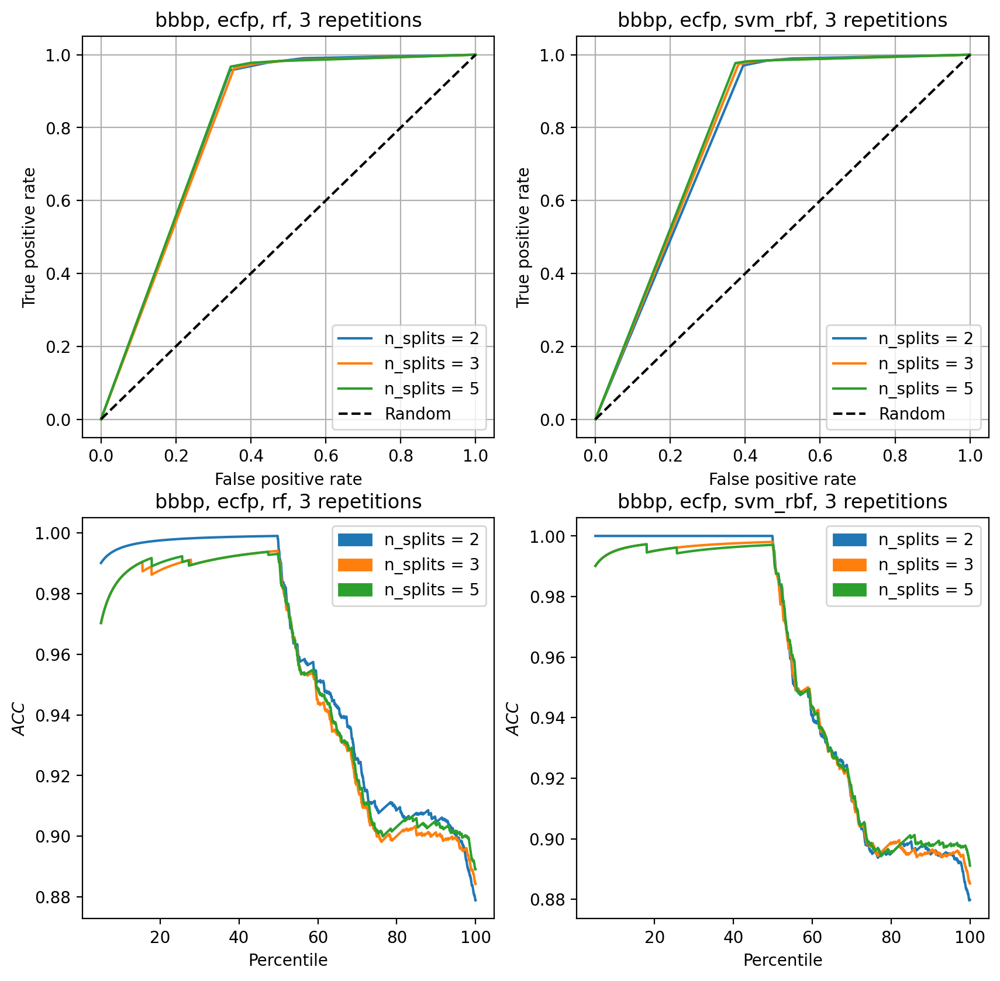

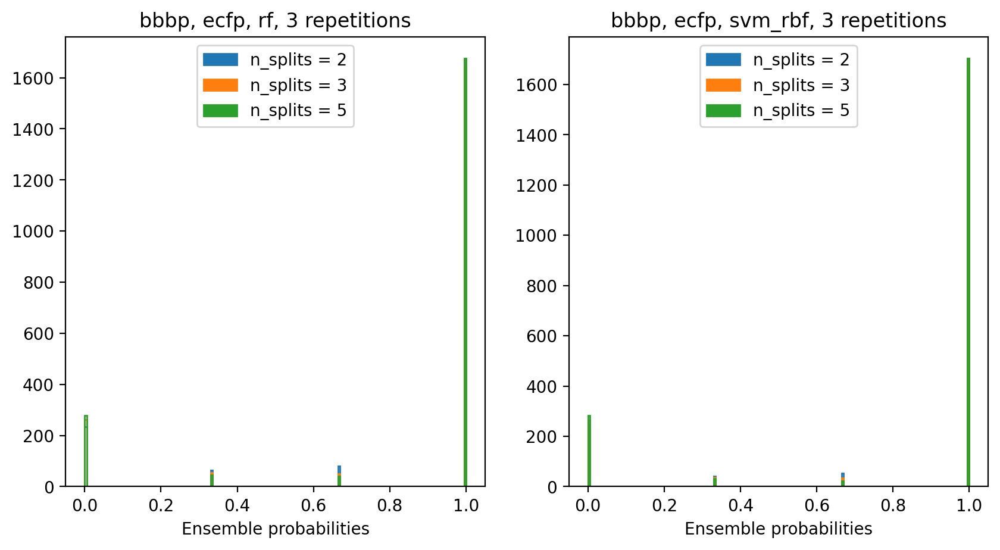

In [6]:
evaluation_automatization('bbbp', 'ecfp', ['rf', 'svm_rbf'], repetitions=3)

Repetition [1/3]


100%|███████████████████████████████████████████| 10/10 [00:06<00:00,  1.53it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 10/10 [00:12<00:00,  1.23s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 10/10 [00:23<00:00,  2.40s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 10/10 [00:26<00:00,  2.65s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 10/10 [00:51<00:00,  5.13s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 10/10 [01:38<00:00,  9.85s/it]


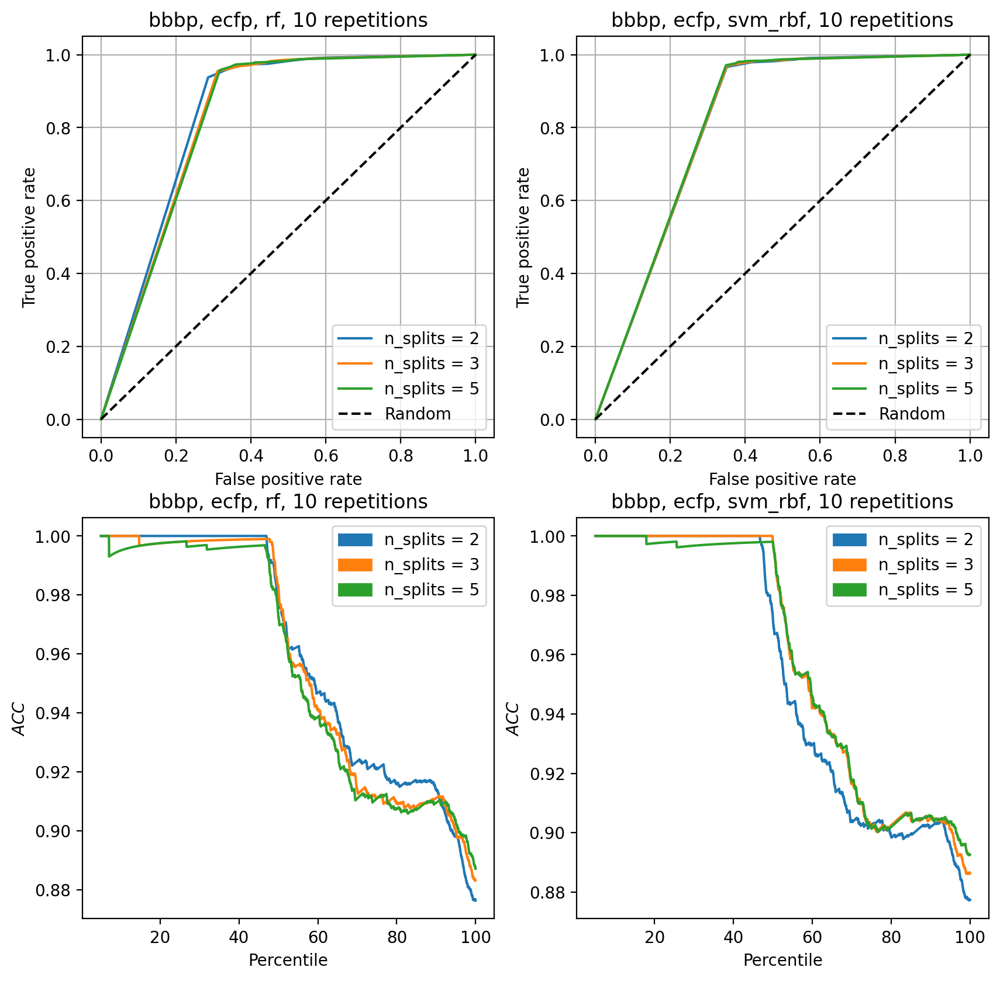

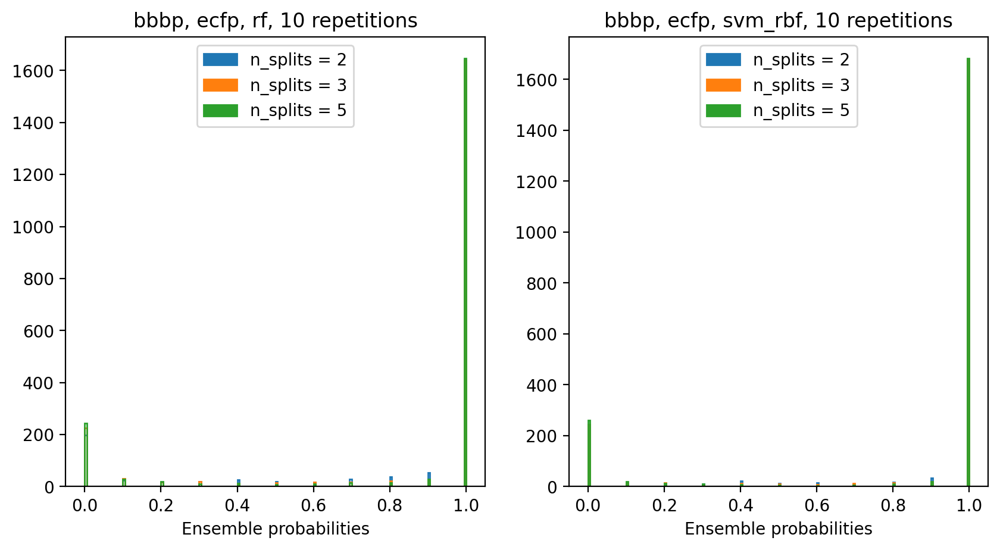

In [8]:
evaluation_automatization('bbbp', 'ecfp', ['rf', 'svm_rbf'], repetitions=10)

Repetition [1/3]


100%|███████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 15/15 [00:17<00:00,  1.19s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 15/15 [00:34<00:00,  2.31s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 15/15 [00:38<00:00,  2.55s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 15/15 [01:16<00:00,  5.11s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 15/15 [02:30<00:00, 10.00s/it]


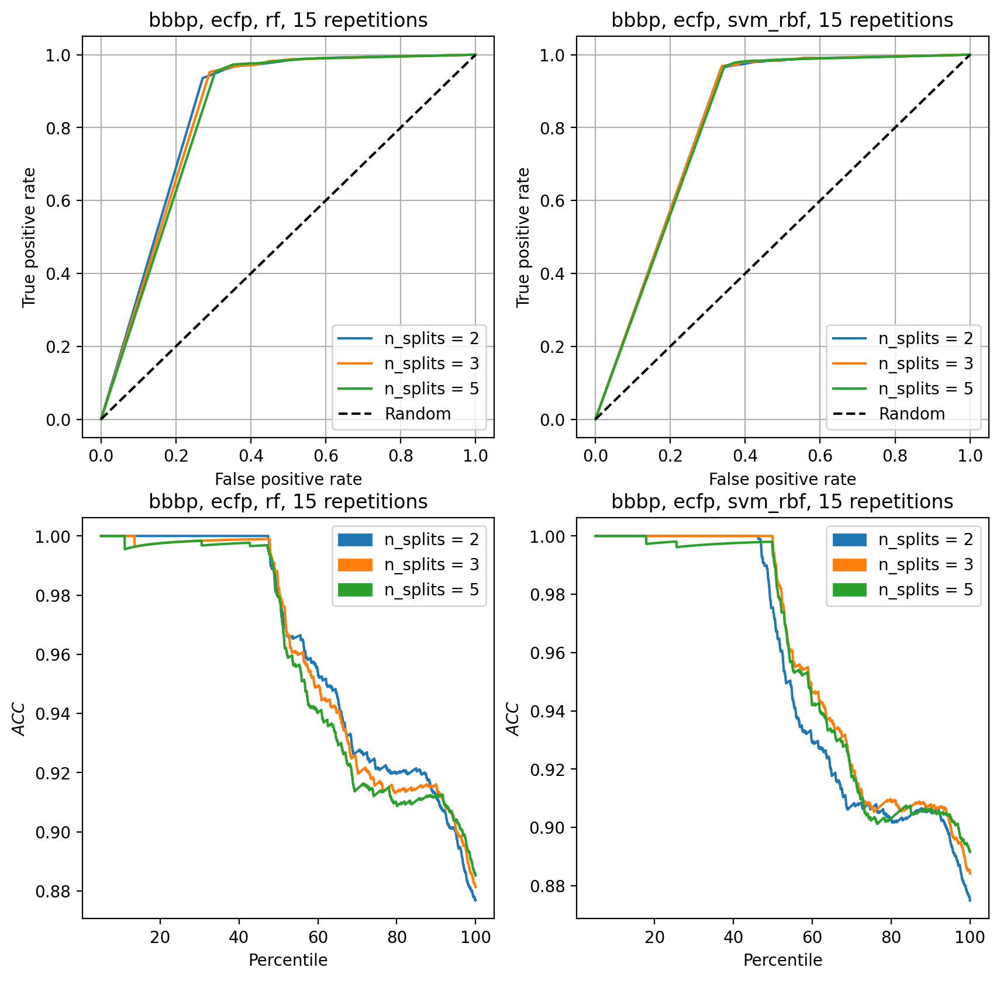

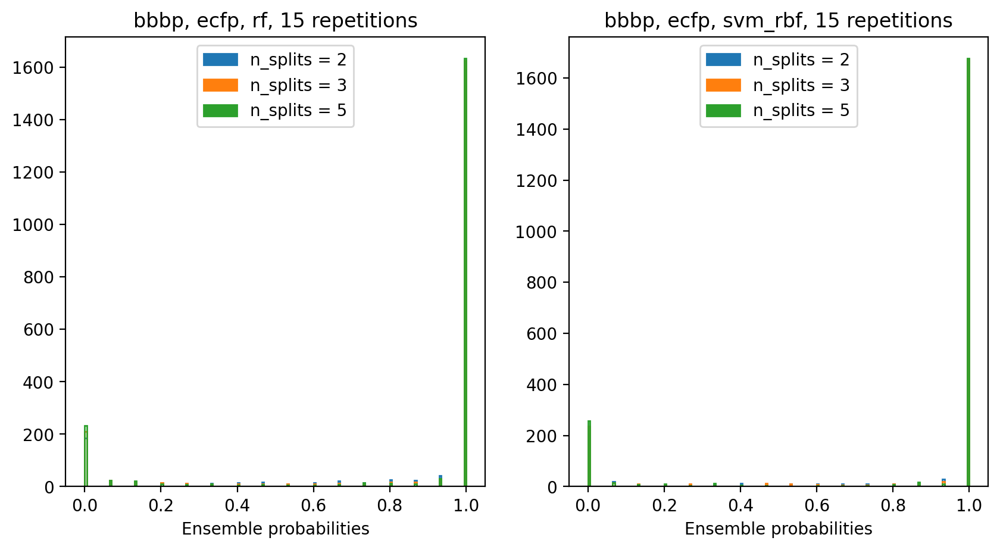

In [9]:
evaluation_automatization('bbbp', 'ecfp', ['rf', 'svm_rbf'], repetitions=15)

Repetition [1/3]


100%|███████████████████████████████████████████| 25/25 [00:16<00:00,  1.54it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 25/25 [00:30<00:00,  1.22s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 25/25 [00:59<00:00,  2.36s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 25/25 [01:05<00:00,  2.63s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 25/25 [02:13<00:00,  5.35s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 25/25 [04:22<00:00, 10.49s/it]


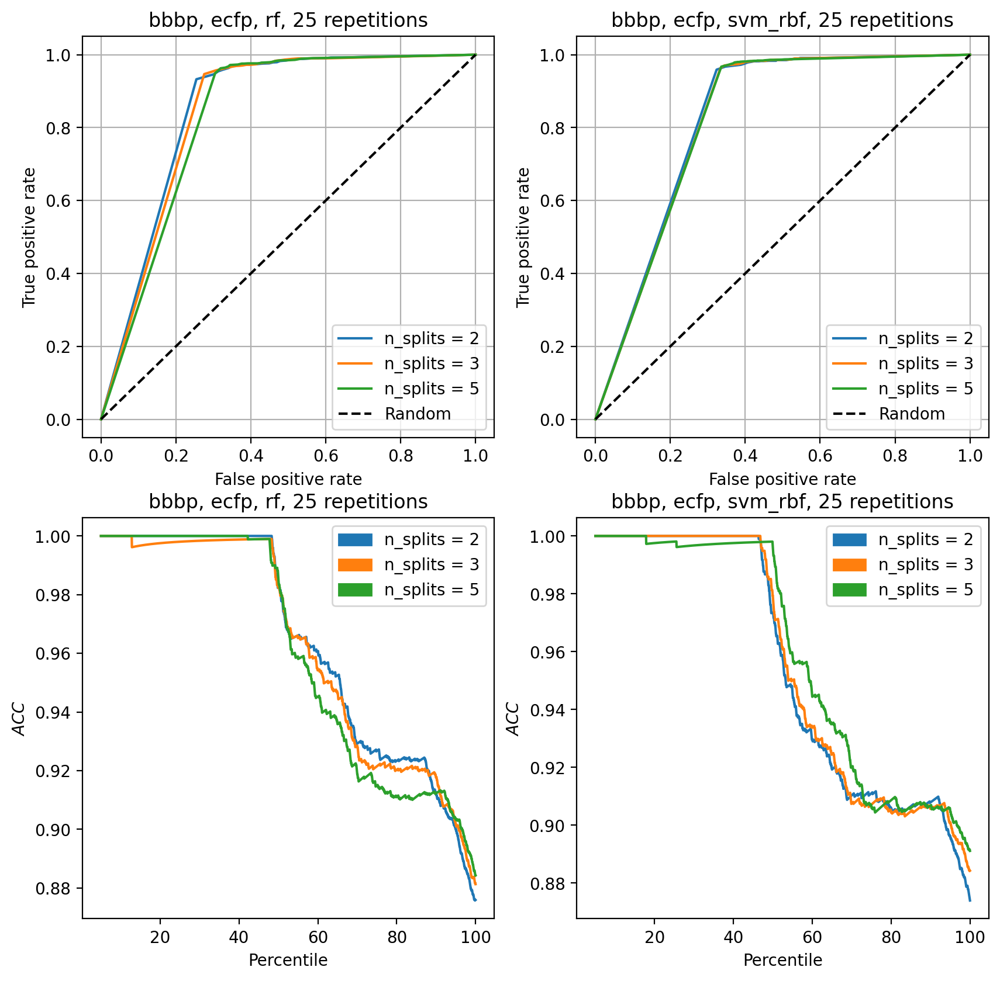

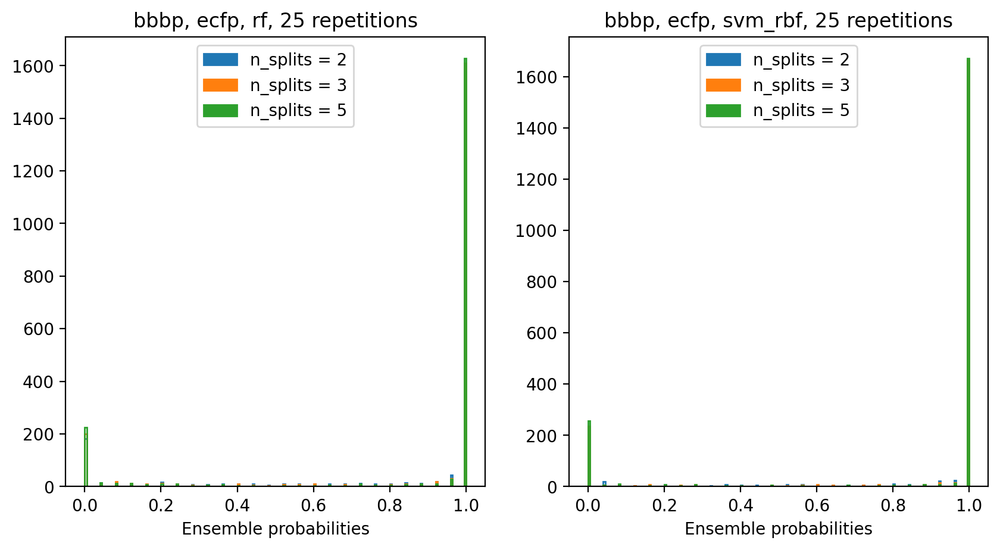

In [10]:
evaluation_automatization('bbbp', 'ecfp', ['rf', 'svm_rbf'], repetitions=25)

Repetition [1/3]


100%|███████████████████████████████████████████| 50/50 [00:33<00:00,  1.49it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 50/50 [01:03<00:00,  1.26s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 50/50 [02:01<00:00,  2.44s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 50/50 [02:16<00:00,  2.73s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 50/50 [04:35<00:00,  5.51s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 50/50 [08:43<00:00, 10.46s/it]


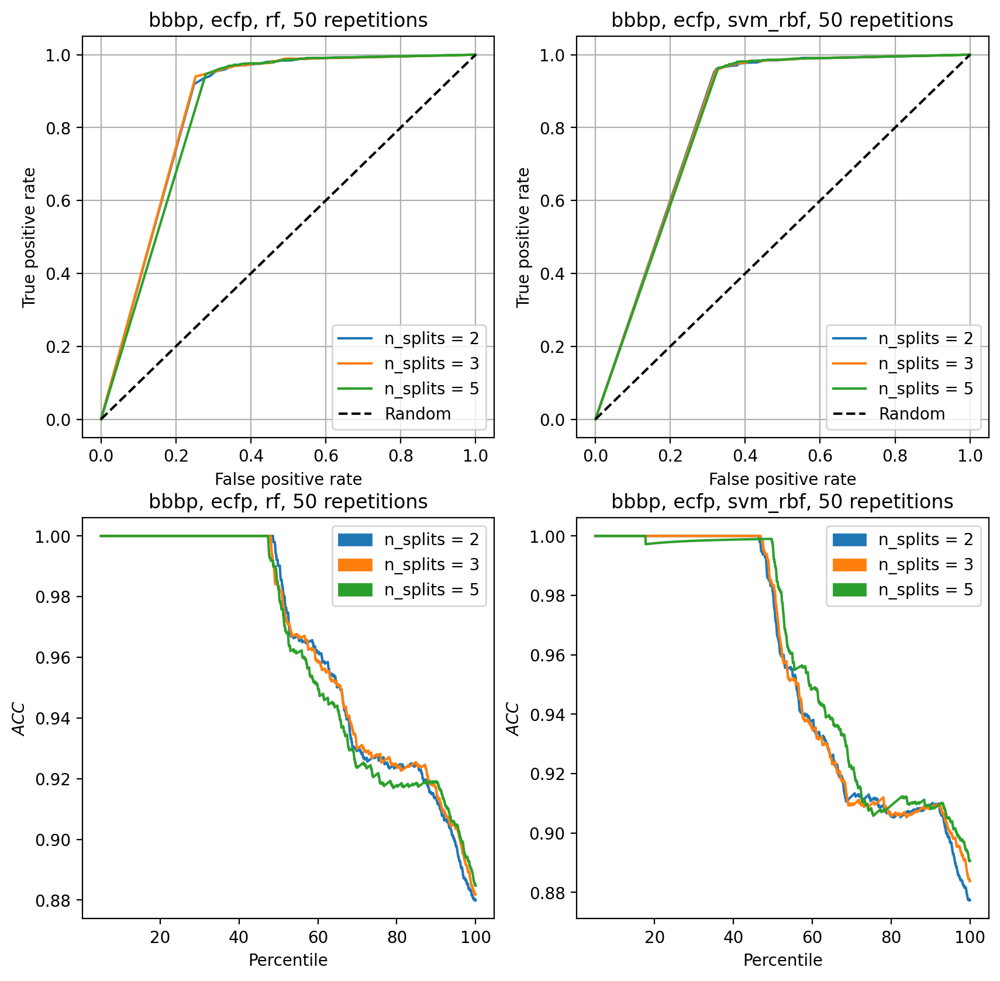

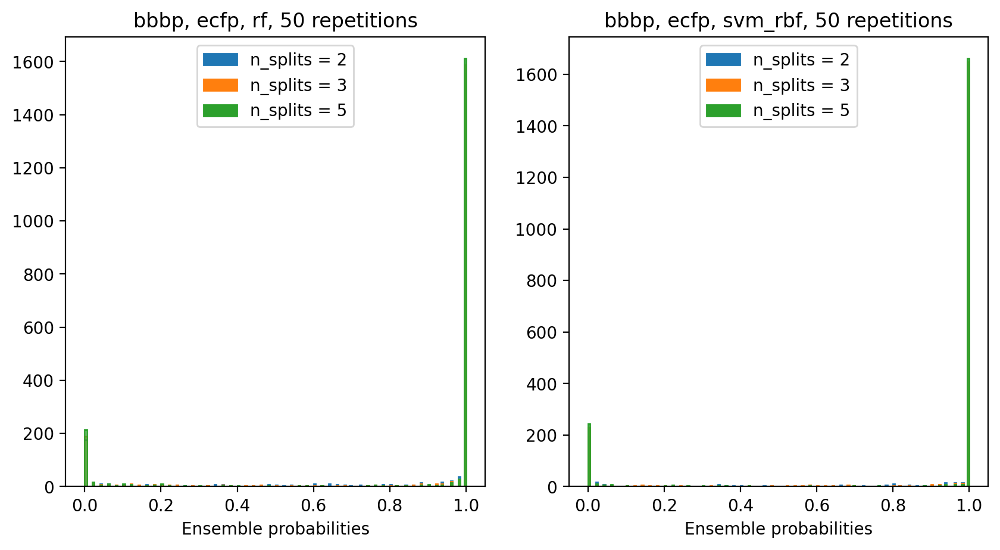

In [11]:
evaluation_automatization('bbbp', 'ecfp', ['rf', 'svm_rbf'], repetitions=50)

Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [01:07<00:00,  1.49it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [02:05<00:00,  1.26s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [04:17<00:00,  2.57s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [04:28<00:00,  2.68s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [08:55<00:00,  5.35s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [17:16<00:00, 10.37s/it]


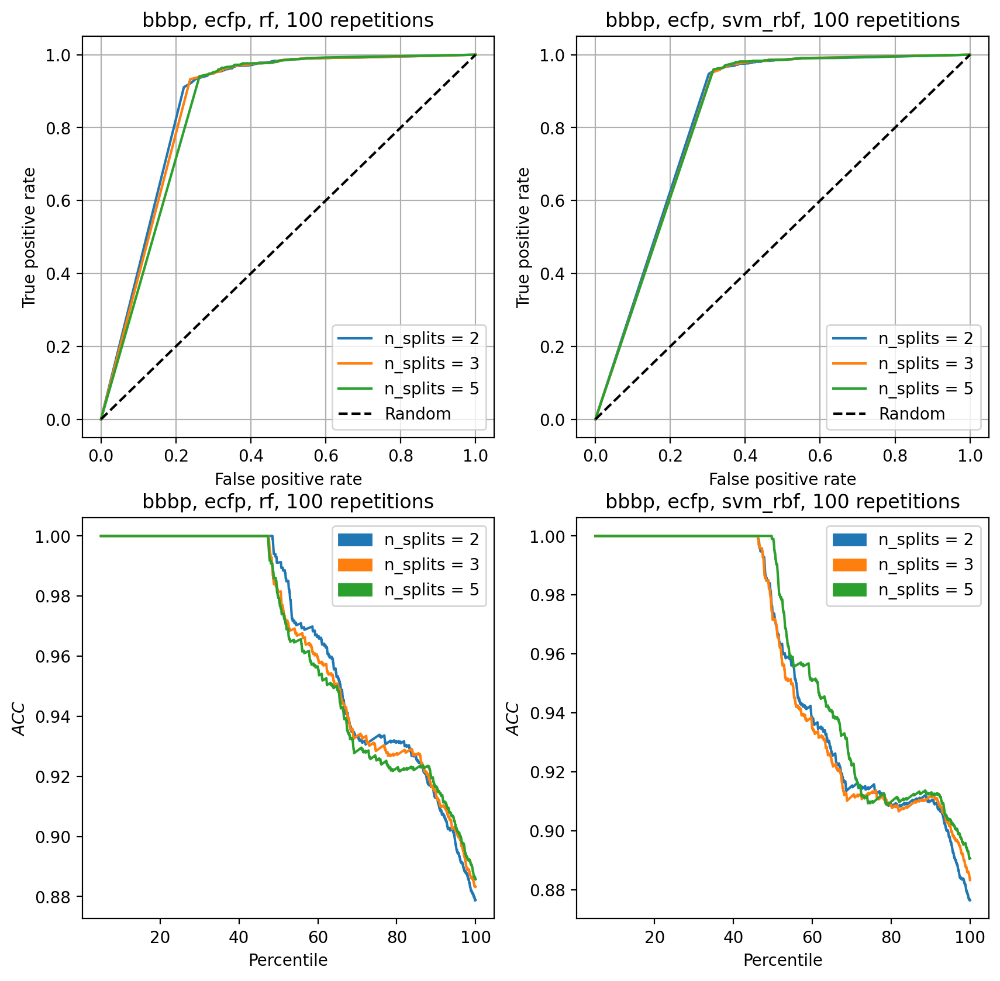

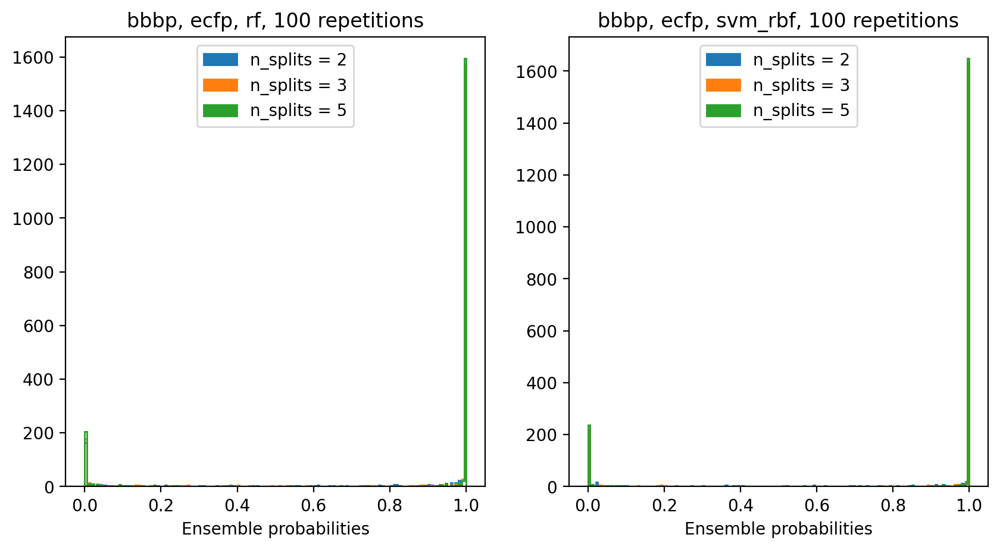

In [12]:
evaluation_automatization('bbbp', 'ecfp', ['rf', 'svm_rbf'], repetitions=100)

#### Testing repetitions bace:

Repetition [1/3]


100%|█████████████████████████████████████████████| 3/3 [00:01<00:00,  2.08it/s]


Repetition [2/3]


100%|█████████████████████████████████████████████| 3/3 [00:02<00:00,  1.15it/s]


Repetition [3/3]


100%|█████████████████████████████████████████████| 3/3 [00:04<00:00,  1.66s/it]


Repetition [1/3]


100%|█████████████████████████████████████████████| 3/3 [00:04<00:00,  1.57s/it]


Repetition [2/3]


100%|█████████████████████████████████████████████| 3/3 [00:09<00:00,  3.25s/it]


Repetition [3/3]


100%|█████████████████████████████████████████████| 3/3 [00:19<00:00,  6.50s/it]


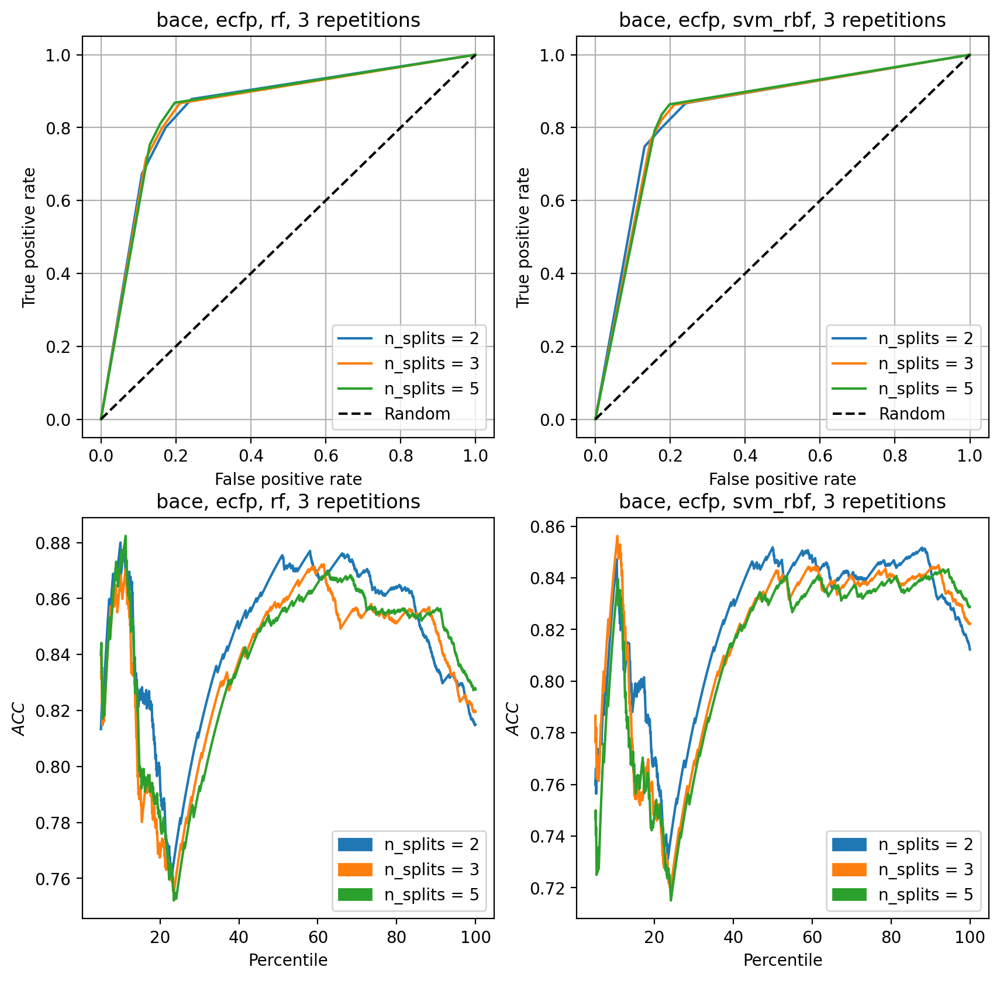

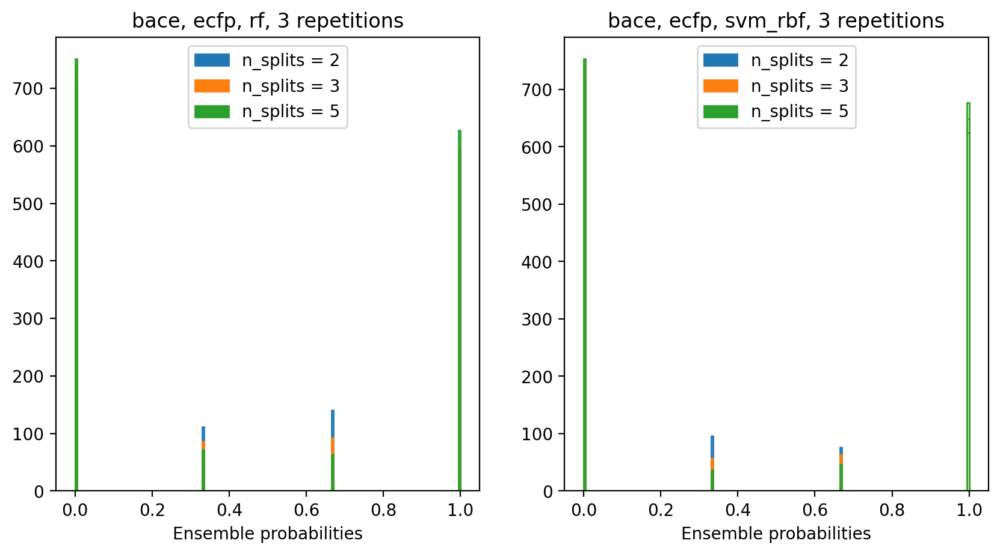

In [14]:
evaluation_automatization('bace', 'ecfp', ['rf', 'svm_rbf'], repetitions=3)

Repetition [1/3]


100%|█████████████████████████████████████████████| 5/5 [00:02<00:00,  2.08it/s]


Repetition [2/3]


100%|█████████████████████████████████████████████| 5/5 [00:04<00:00,  1.15it/s]


Repetition [3/3]


100%|█████████████████████████████████████████████| 5/5 [00:08<00:00,  1.66s/it]


Repetition [1/3]


100%|█████████████████████████████████████████████| 5/5 [00:07<00:00,  1.57s/it]


Repetition [2/3]


100%|█████████████████████████████████████████████| 5/5 [00:16<00:00,  3.22s/it]


Repetition [3/3]


100%|█████████████████████████████████████████████| 5/5 [00:32<00:00,  6.44s/it]


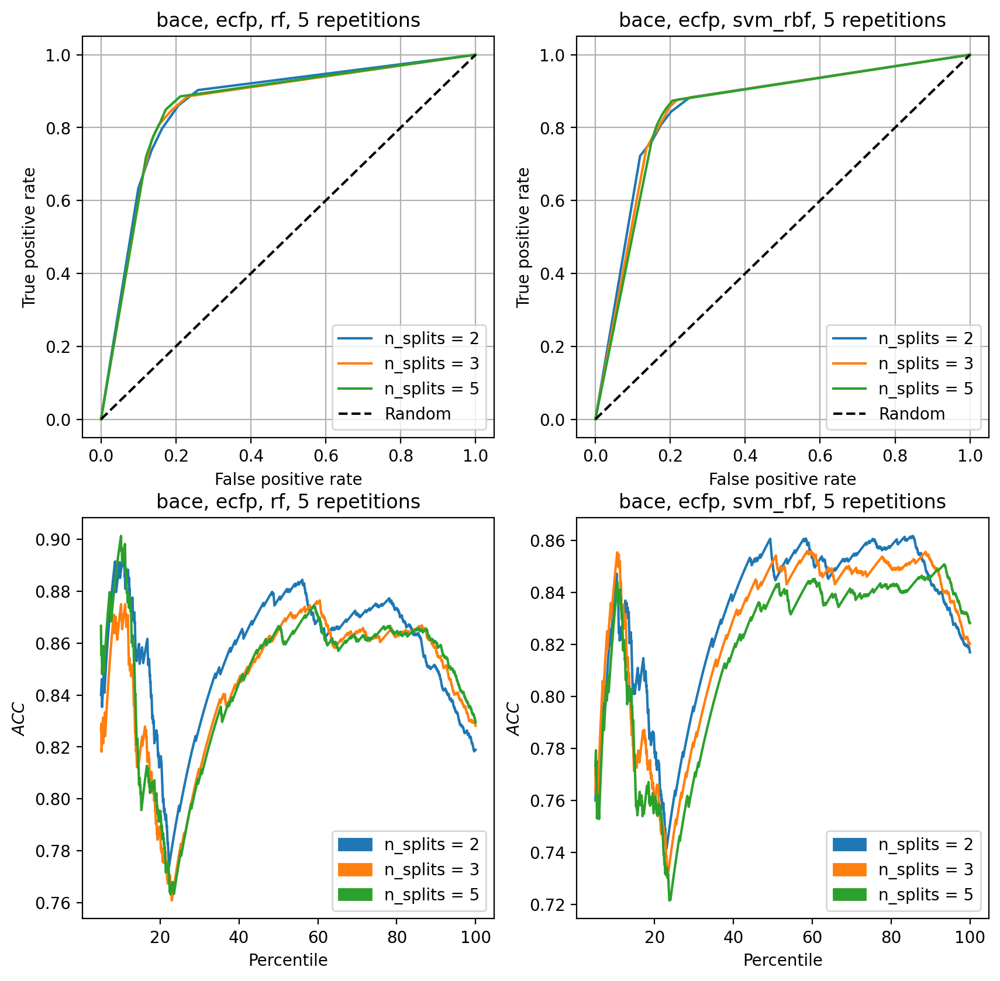

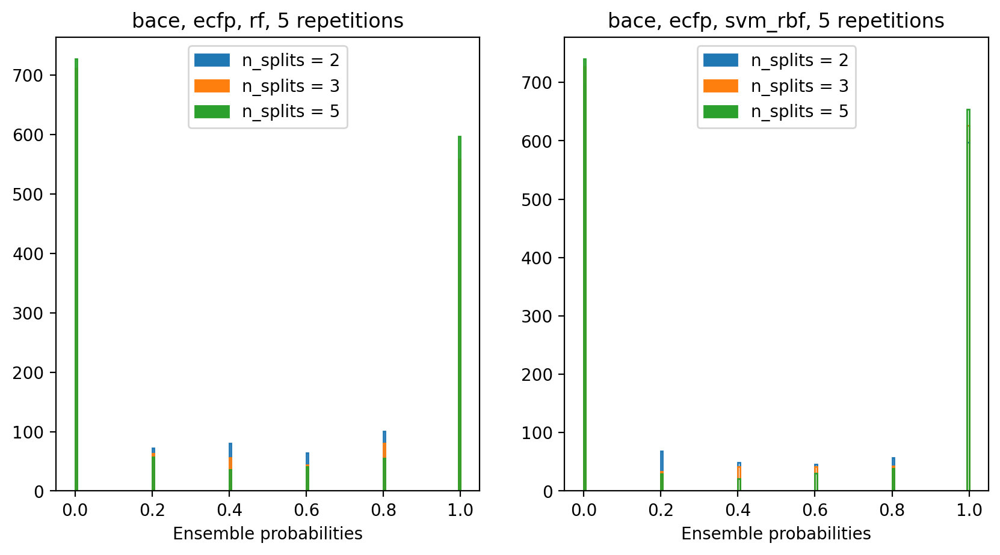

In [15]:
evaluation_automatization('bace', 'ecfp', ['rf', 'svm_rbf'], repetitions=5)

Repetition [1/3]


100%|███████████████████████████████████████████| 10/10 [00:04<00:00,  2.07it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 10/10 [00:08<00:00,  1.13it/s]


Repetition [3/3]


100%|███████████████████████████████████████████| 10/10 [00:16<00:00,  1.67s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 10/10 [00:15<00:00,  1.59s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 10/10 [00:32<00:00,  3.25s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 10/10 [01:05<00:00,  6.51s/it]


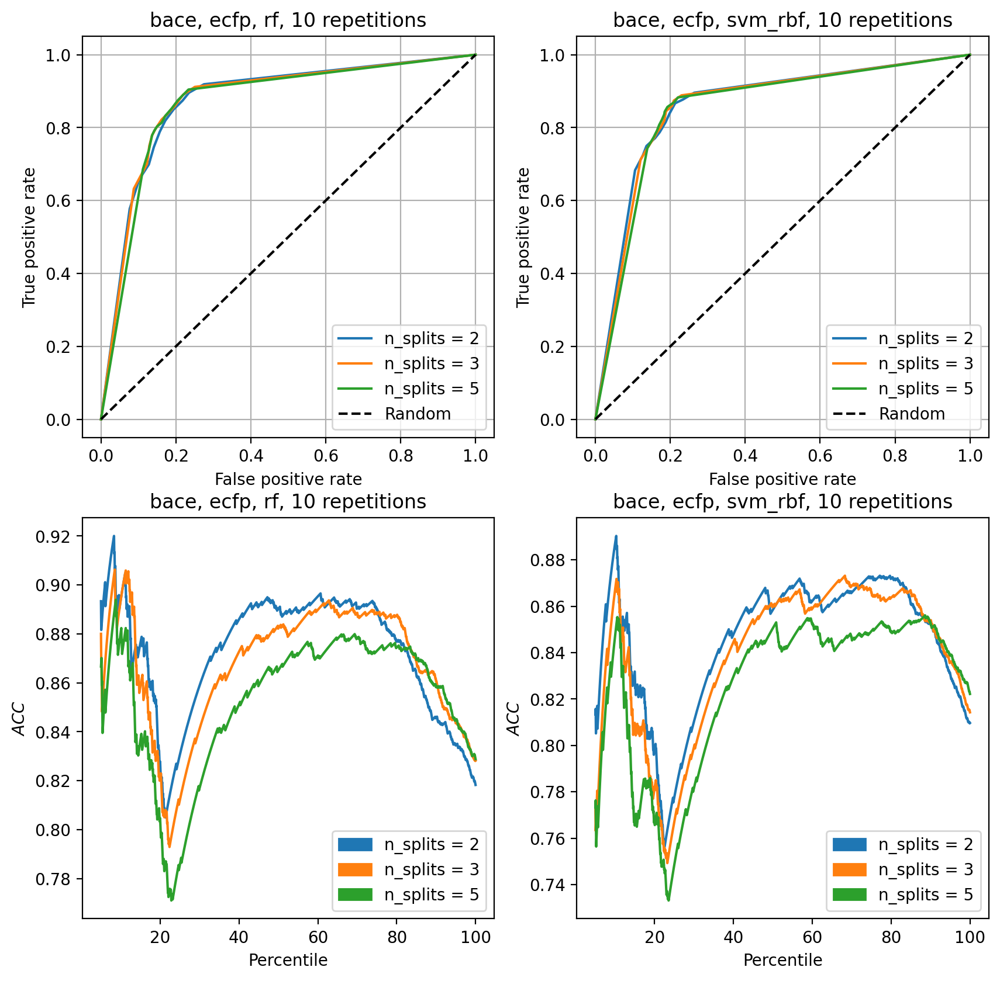

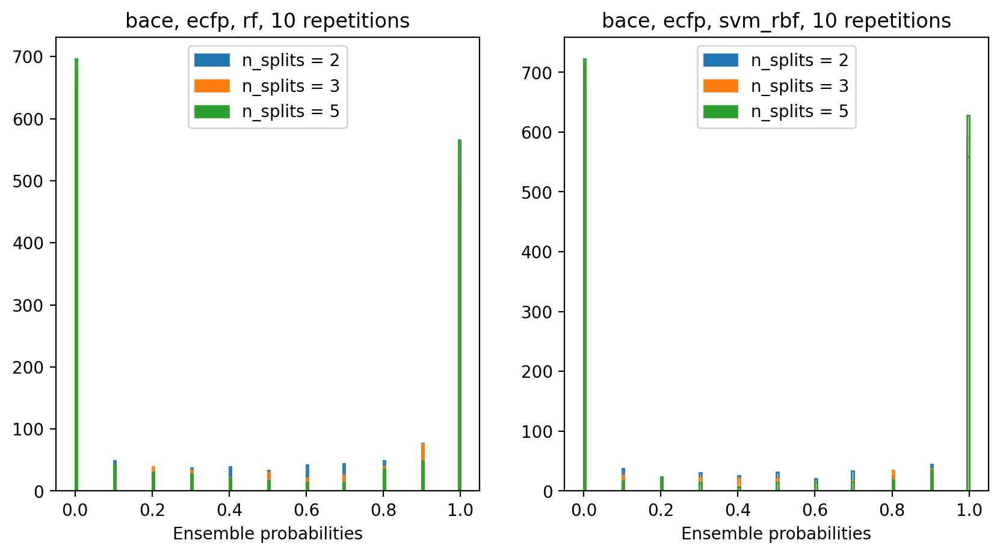

In [16]:
evaluation_automatization('bace', 'ecfp', ['rf', 'svm_rbf'], repetitions=10)

Repetition [1/3]


100%|███████████████████████████████████████████| 15/15 [00:07<00:00,  2.04it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Repetition [3/3]


100%|███████████████████████████████████████████| 15/15 [00:25<00:00,  1.67s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 15/15 [00:23<00:00,  1.56s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 15/15 [00:47<00:00,  3.13s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 15/15 [01:36<00:00,  6.42s/it]


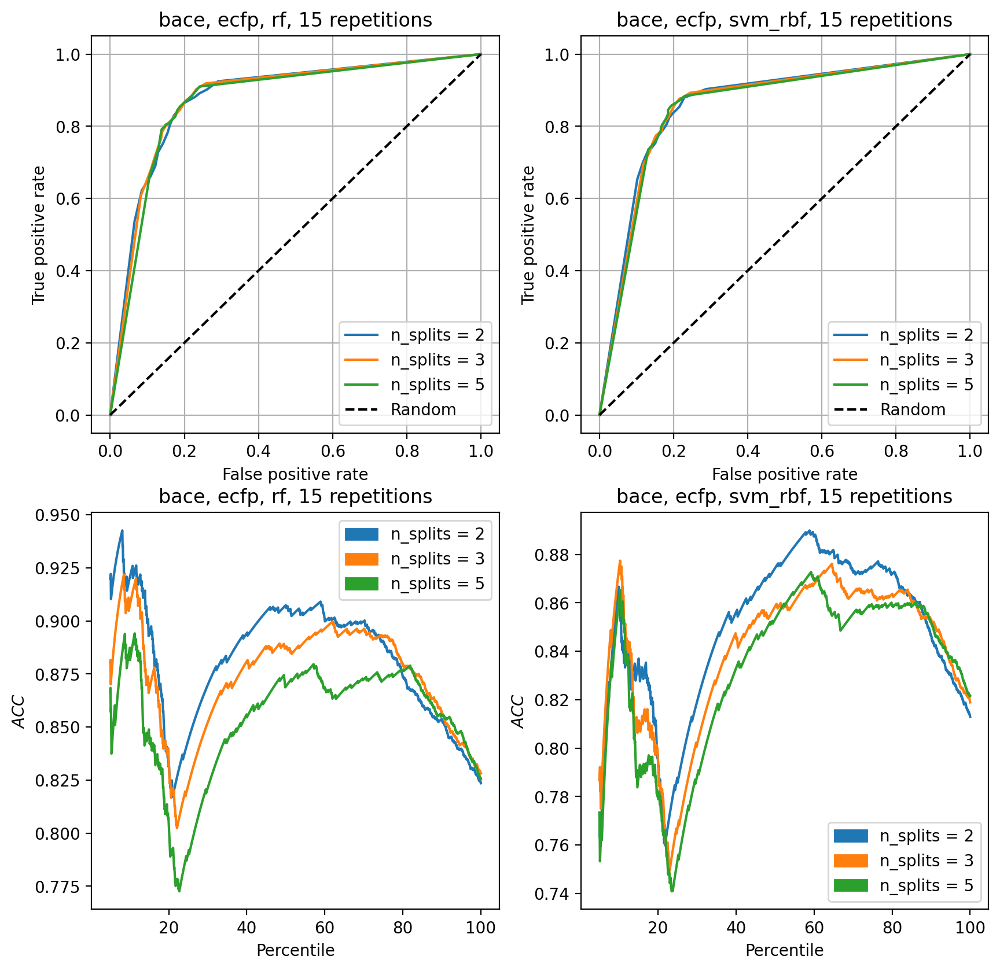

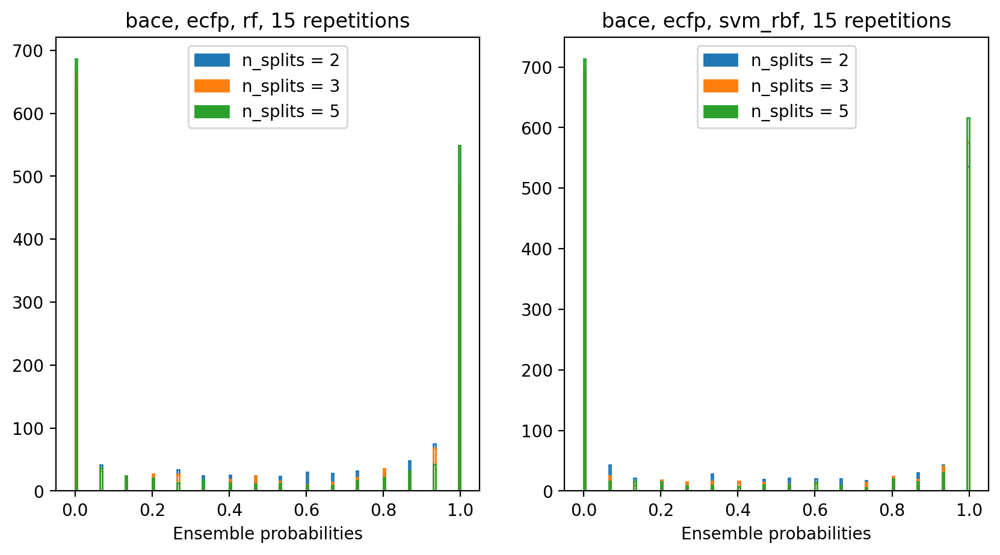

In [17]:
evaluation_automatization('bace', 'ecfp', ['rf', 'svm_rbf'], repetitions=15)

Repetition [1/3]


100%|███████████████████████████████████████████| 25/25 [00:12<00:00,  2.07it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 25/25 [00:21<00:00,  1.14it/s]


Repetition [3/3]


100%|███████████████████████████████████████████| 25/25 [00:41<00:00,  1.64s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 25/25 [00:39<00:00,  1.59s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 25/25 [01:20<00:00,  3.20s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 25/25 [02:40<00:00,  6.43s/it]


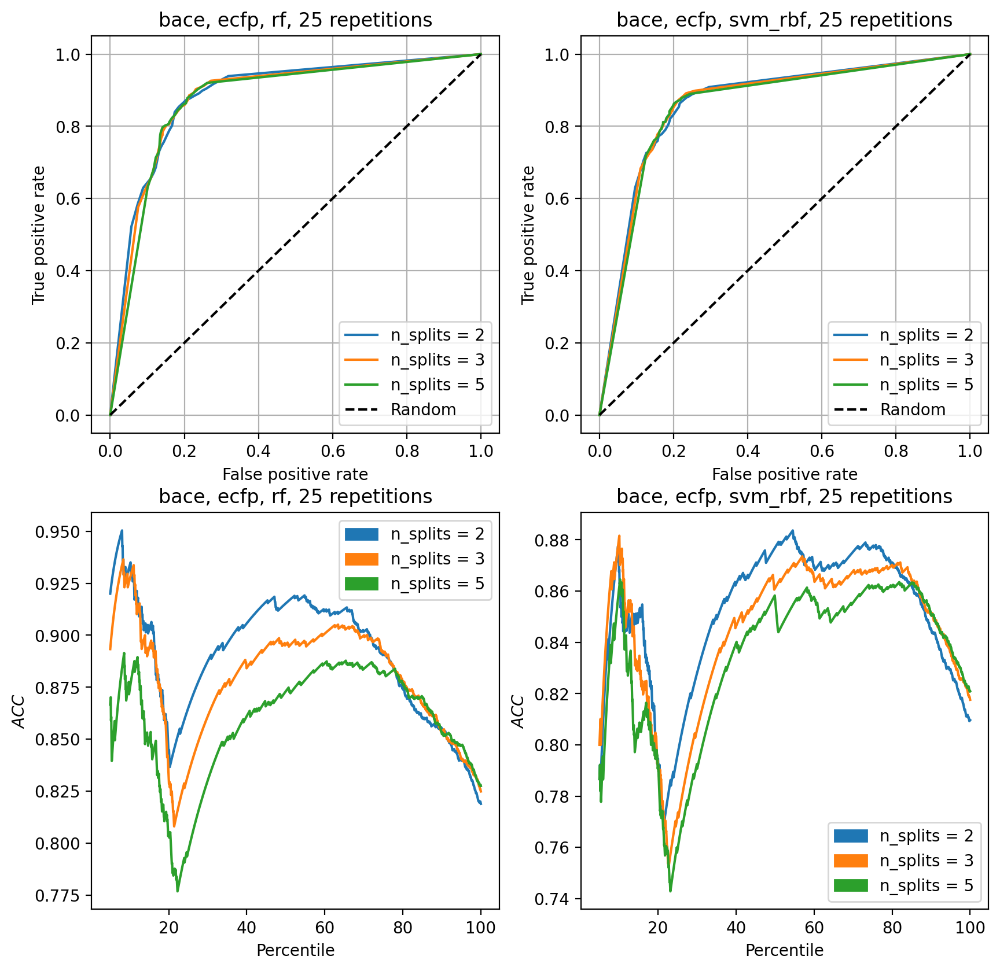

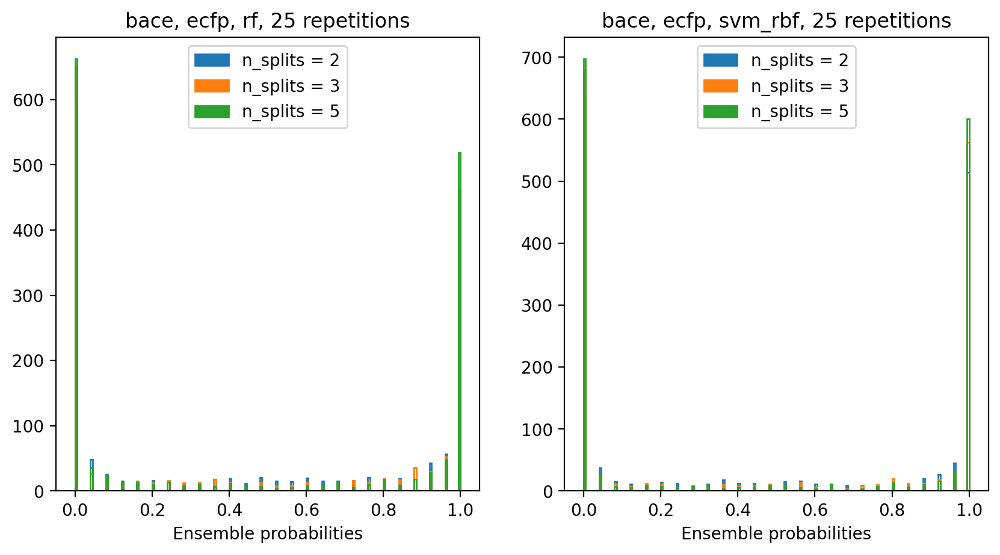

In [18]:
evaluation_automatization('bace', 'ecfp', ['rf', 'svm_rbf'], repetitions=25)

Repetition [1/3]


100%|███████████████████████████████████████████| 50/50 [00:23<00:00,  2.12it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 50/50 [00:42<00:00,  1.17it/s]


Repetition [3/3]


100%|███████████████████████████████████████████| 50/50 [01:20<00:00,  1.62s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 50/50 [01:19<00:00,  1.59s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 50/50 [02:37<00:00,  3.15s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 50/50 [05:30<00:00,  6.61s/it]


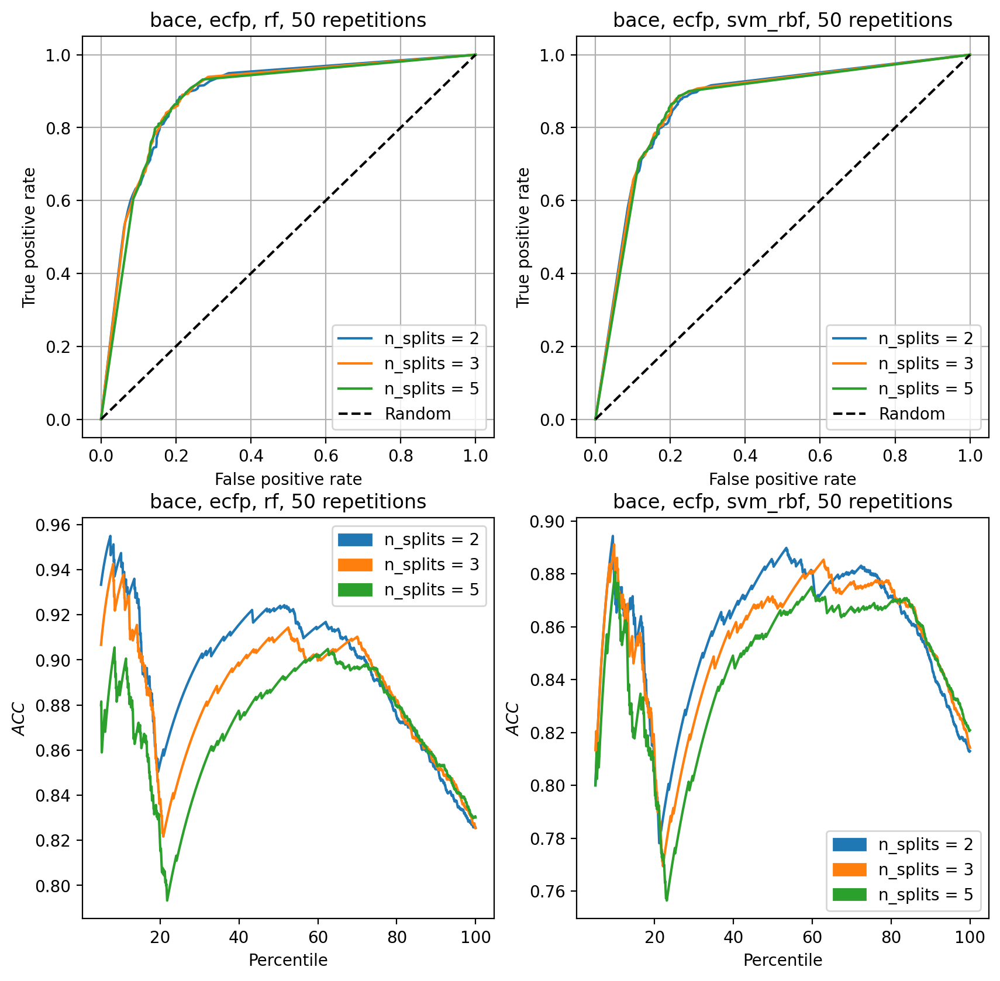

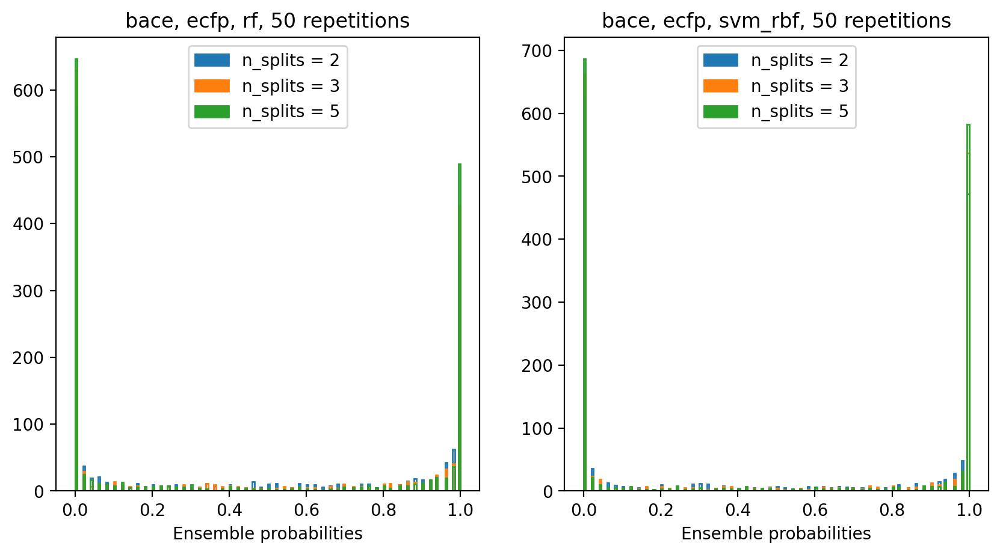

In [19]:
evaluation_automatization('bace', 'ecfp', ['rf', 'svm_rbf'], repetitions=50)

Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [00:49<00:00,  2.01it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [01:29<00:00,  1.11it/s]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [02:48<00:00,  1.69s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [02:41<00:00,  1.61s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [05:24<00:00,  3.25s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [10:49<00:00,  6.49s/it]


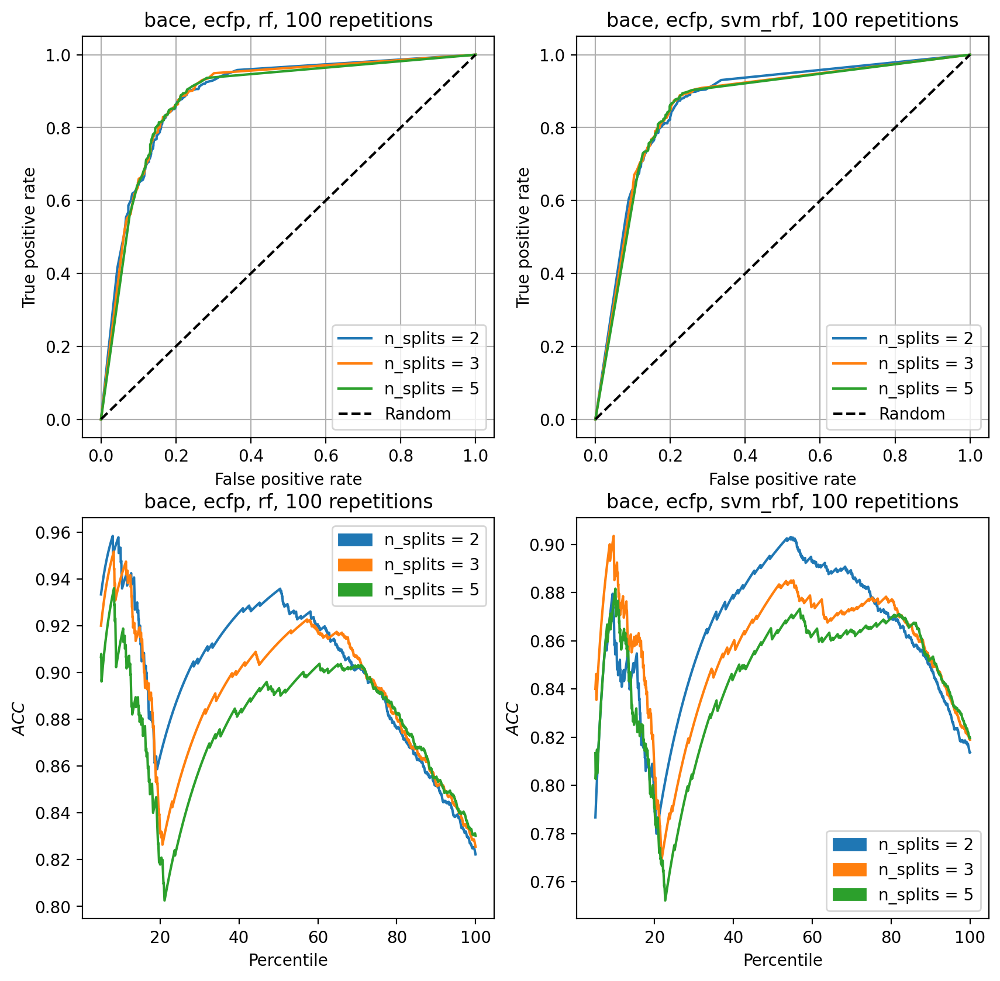

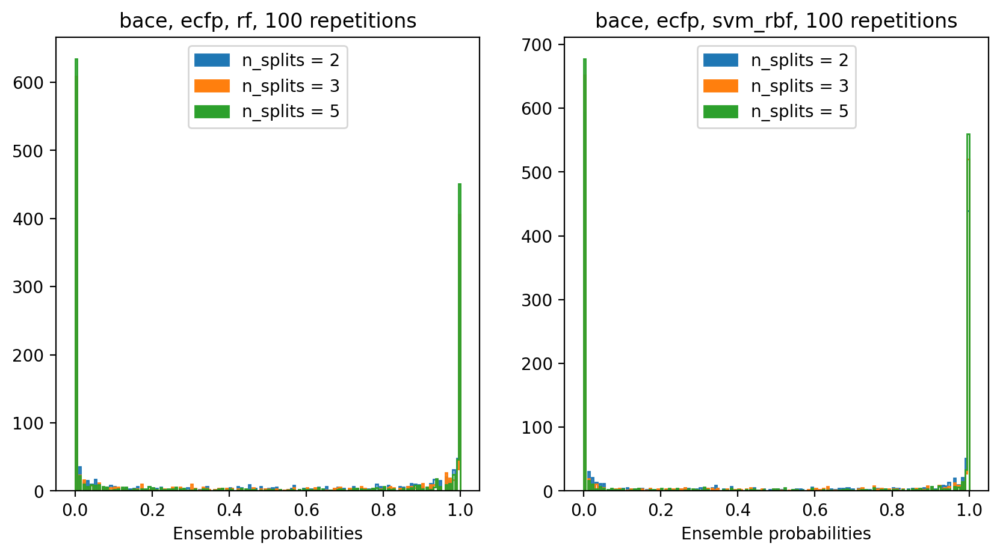

In [20]:
evaluation_automatization('bace', 'ecfp', ['rf', 'svm_rbf'], repetitions=100)

#### Testing repetitions hERG3:

Repetition [1/3]


100%|█████████████████████████████████████████████| 3/3 [00:02<00:00,  1.38it/s]


Repetition [2/3]


100%|█████████████████████████████████████████████| 3/3 [00:04<00:00,  1.36s/it]


Repetition [3/3]


100%|█████████████████████████████████████████████| 3/3 [00:07<00:00,  2.65s/it]


Repetition [1/3]


100%|█████████████████████████████████████████████| 3/3 [00:12<00:00,  4.20s/it]


Repetition [2/3]


100%|█████████████████████████████████████████████| 3/3 [00:25<00:00,  8.50s/it]


Repetition [3/3]


100%|█████████████████████████████████████████████| 3/3 [01:00<00:00, 20.25s/it]


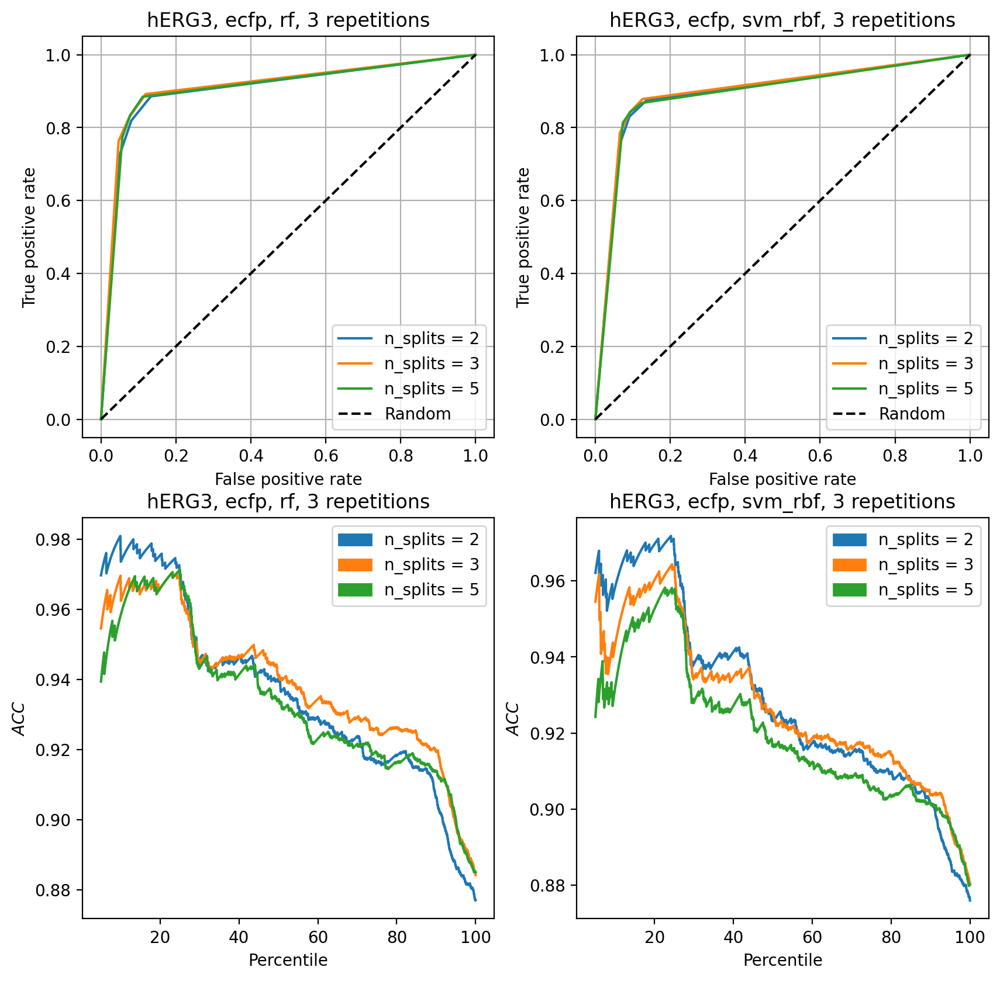

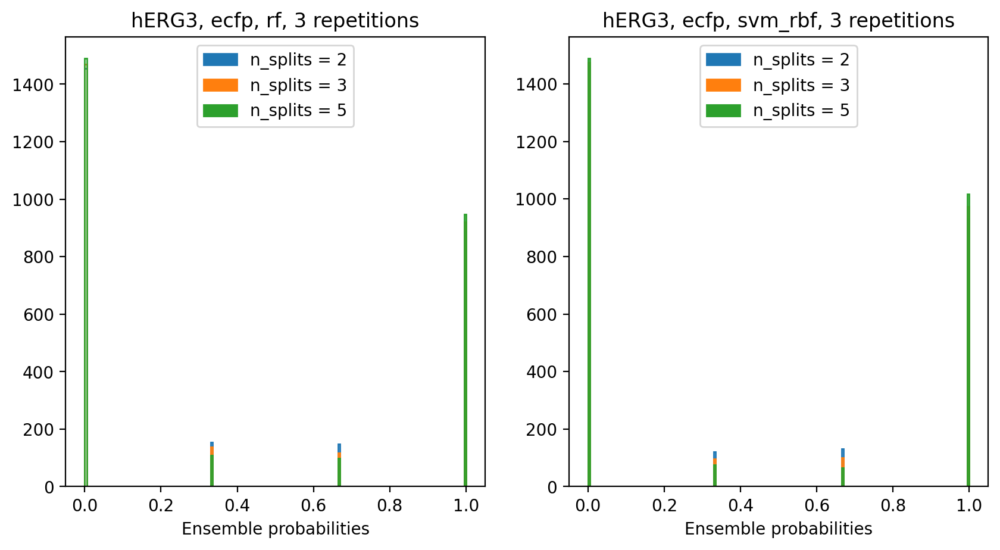

In [21]:
evaluation_automatization('hERG3', 'ecfp', ['rf', 'svm_rbf'], repetitions=3)

Repetition [1/3]


100%|█████████████████████████████████████████████| 5/5 [00:03<00:00,  1.39it/s]


Repetition [2/3]


100%|█████████████████████████████████████████████| 5/5 [00:06<00:00,  1.35s/it]


Repetition [3/3]


100%|█████████████████████████████████████████████| 5/5 [00:13<00:00,  2.63s/it]


Repetition [1/3]


100%|█████████████████████████████████████████████| 5/5 [00:21<00:00,  4.22s/it]


Repetition [2/3]


100%|█████████████████████████████████████████████| 5/5 [00:42<00:00,  8.58s/it]


Repetition [3/3]


100%|█████████████████████████████████████████████| 5/5 [01:45<00:00, 21.02s/it]


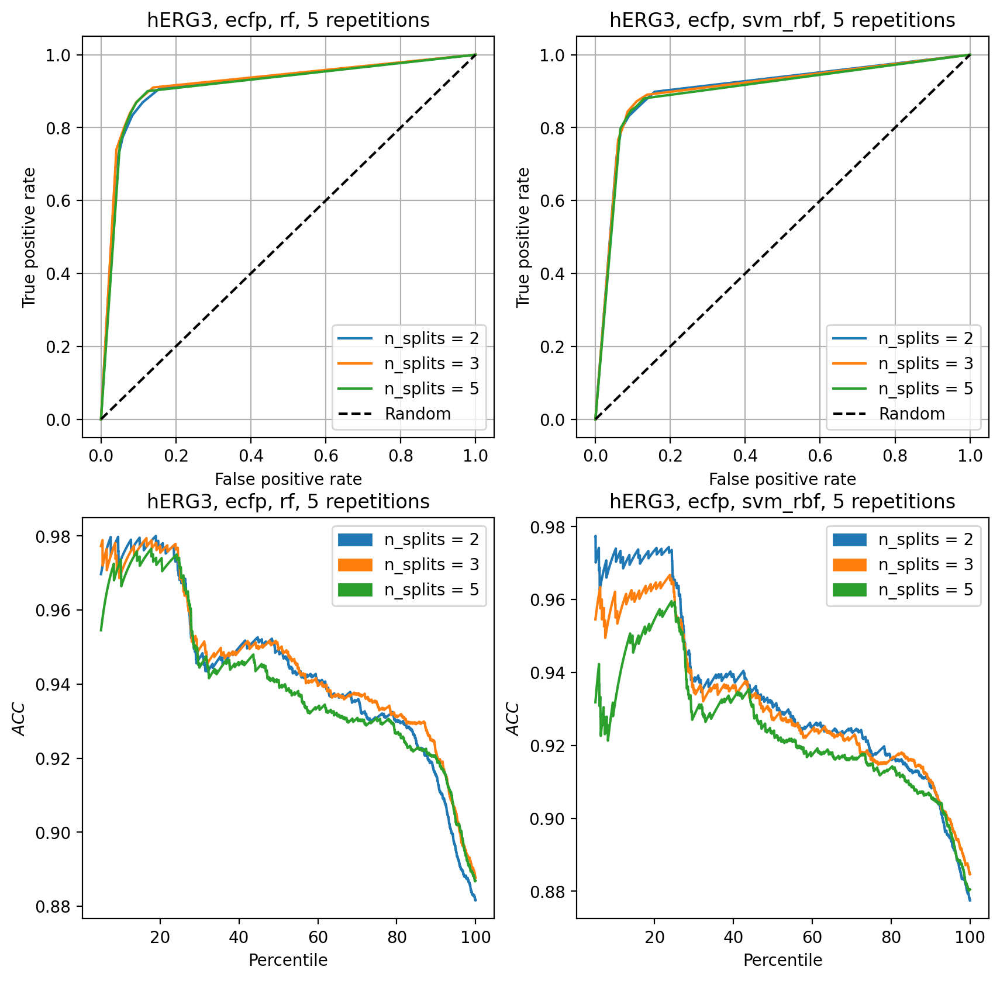

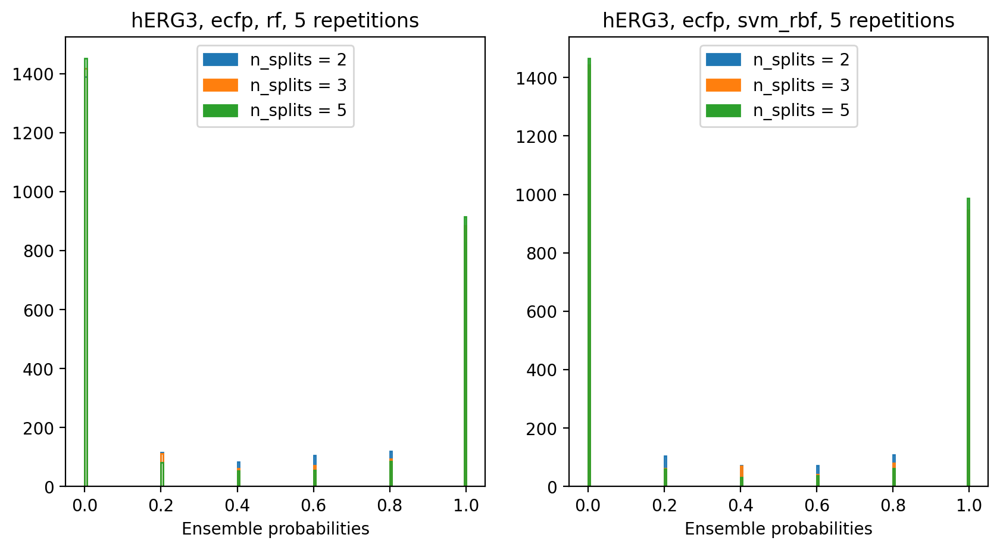

In [22]:
evaluation_automatization('hERG3', 'ecfp', ['rf', 'svm_rbf'], repetitions=5)

Repetition [1/3]


100%|███████████████████████████████████████████| 10/10 [00:07<00:00,  1.39it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 10/10 [00:13<00:00,  1.35s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 10/10 [00:26<00:00,  2.64s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 10/10 [00:45<00:00,  4.56s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 10/10 [01:27<00:00,  8.75s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 10/10 [03:22<00:00, 20.30s/it]


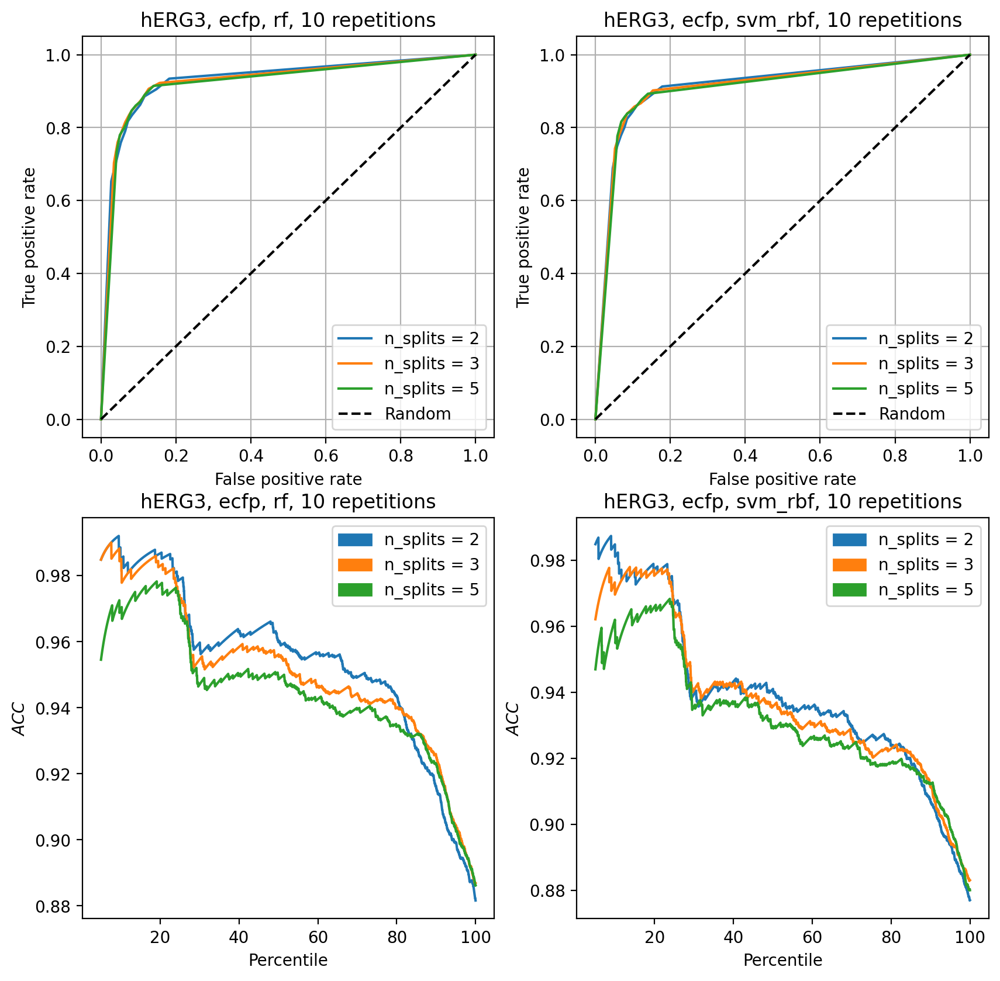

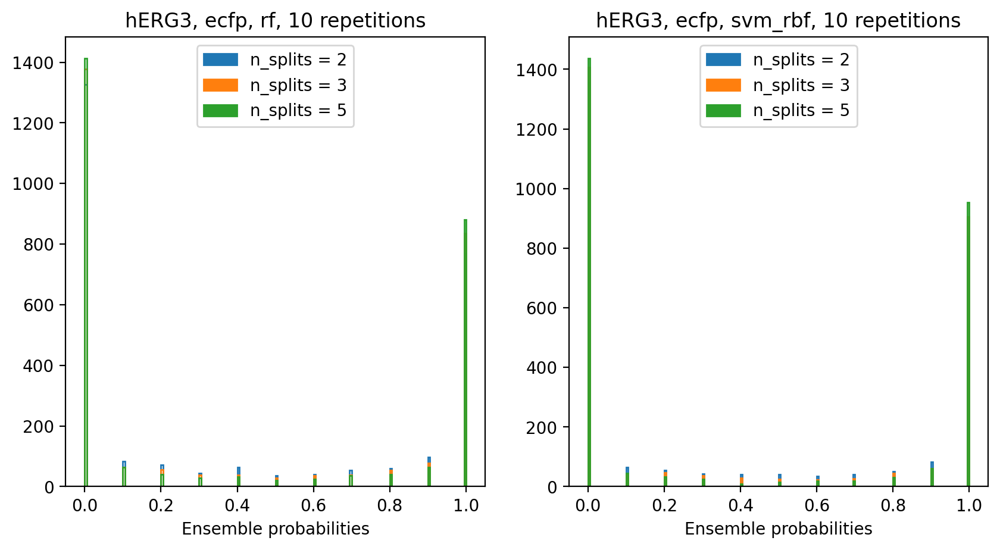

In [23]:
evaluation_automatization('hERG3', 'ecfp', ['rf', 'svm_rbf'], repetitions=10)

Repetition [1/3]


100%|███████████████████████████████████████████| 15/15 [00:10<00:00,  1.39it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 15/15 [00:20<00:00,  1.35s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 15/15 [00:39<00:00,  2.63s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 15/15 [01:04<00:00,  4.29s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 15/15 [02:11<00:00,  8.74s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 15/15 [05:02<00:00, 20.14s/it]


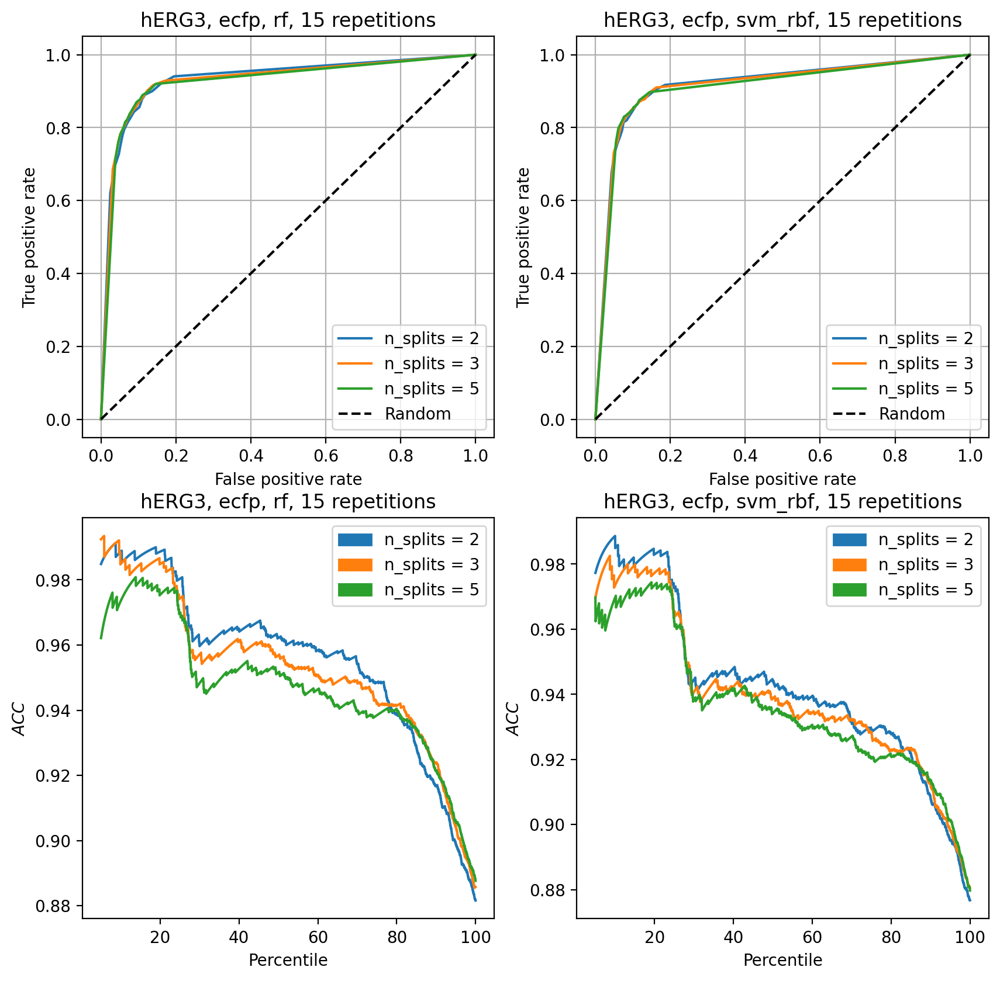

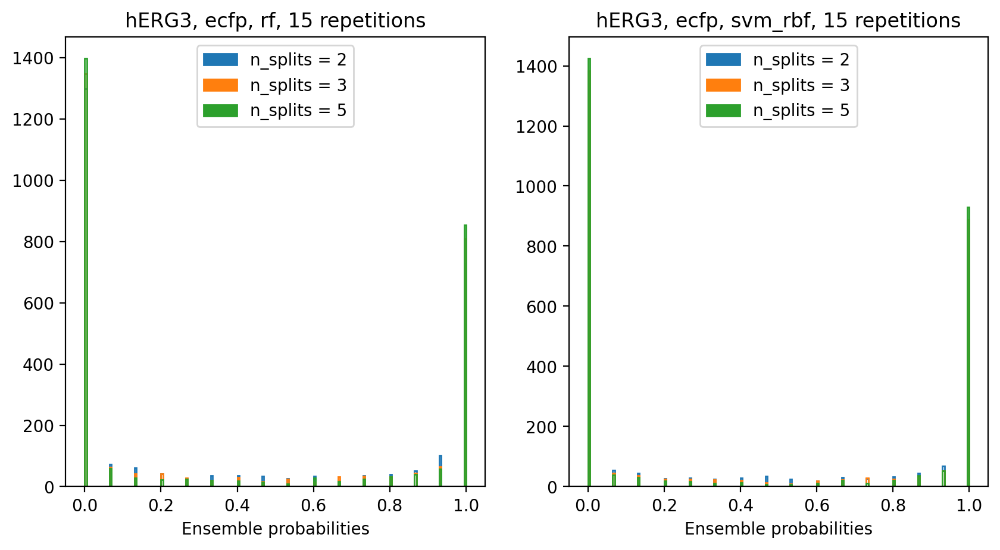

In [24]:
evaluation_automatization('hERG3', 'ecfp', ['rf', 'svm_rbf'], repetitions=15)

Repetition [1/3]


100%|███████████████████████████████████████████| 25/25 [00:18<00:00,  1.39it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 25/25 [00:34<00:00,  1.38s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 25/25 [01:05<00:00,  2.64s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 25/25 [01:48<00:00,  4.36s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 25/25 [03:38<00:00,  8.74s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 25/25 [08:38<00:00, 20.72s/it]


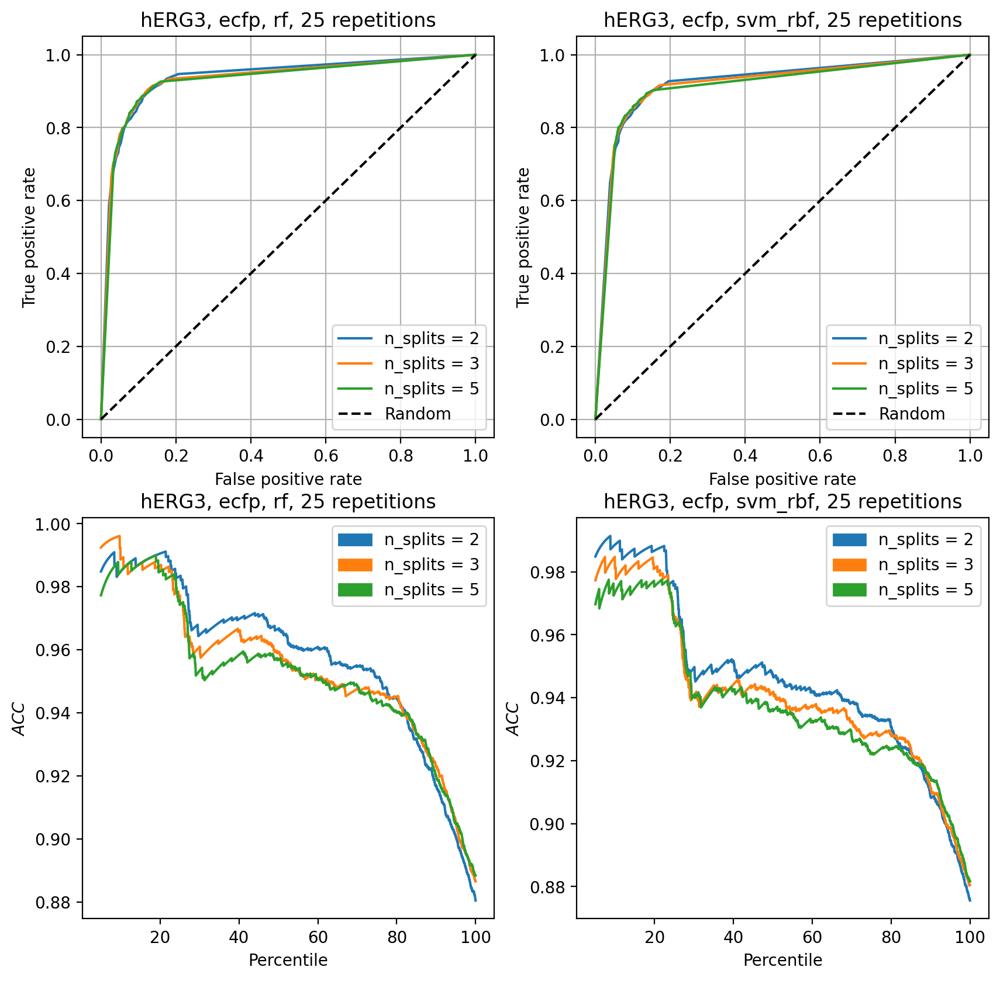

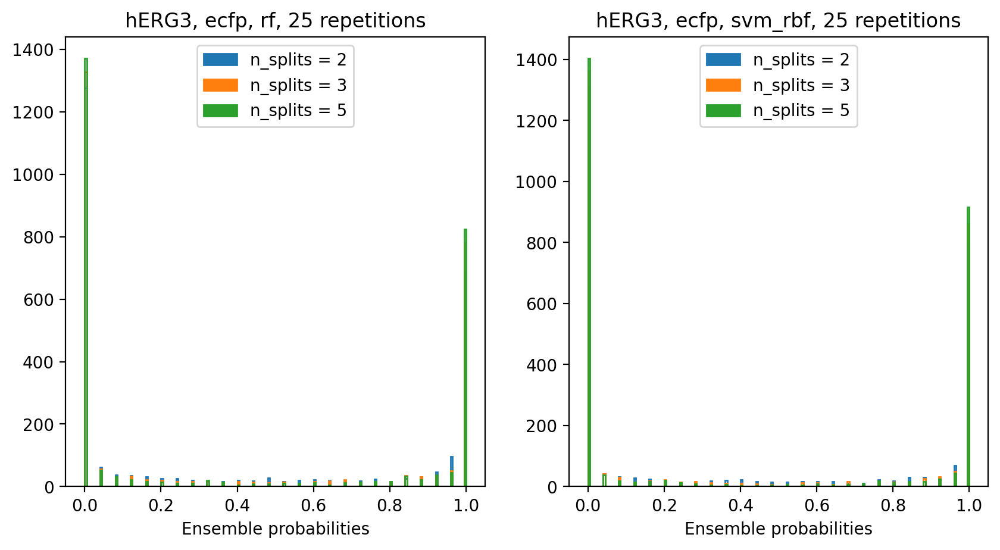

In [25]:
evaluation_automatization('hERG3', 'ecfp', ['rf', 'svm_rbf'], repetitions=25)

Repetition [1/3]


100%|███████████████████████████████████████████| 50/50 [00:37<00:00,  1.35it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 50/50 [01:17<00:00,  1.56s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 50/50 [02:39<00:00,  3.18s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 50/50 [03:59<00:00,  4.79s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 50/50 [08:41<00:00, 10.42s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 50/50 [19:00<00:00, 22.80s/it]


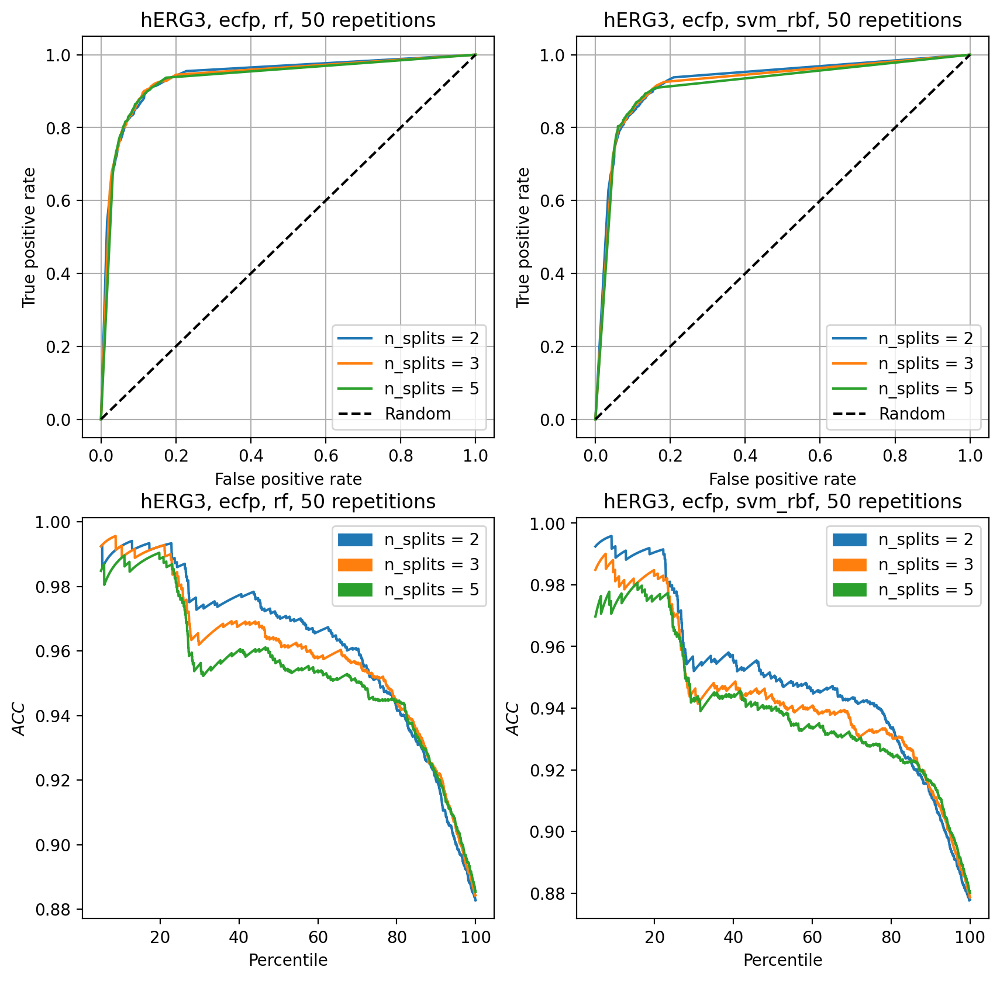

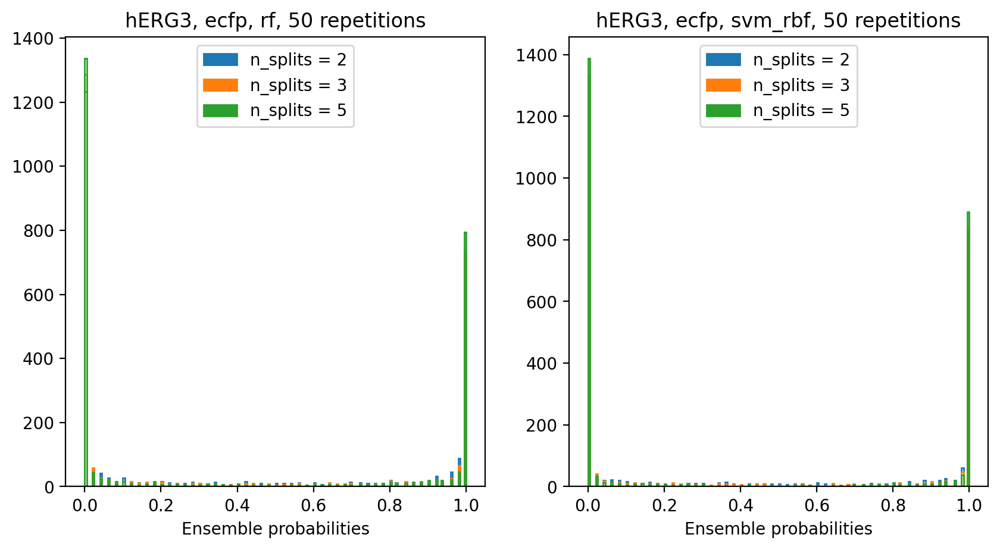

In [26]:
evaluation_automatization('hERG3', 'ecfp', ['rf', 'svm_rbf'], repetitions=50)

Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [01:14<00:00,  1.34it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [02:20<00:00,  1.41s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [04:41<00:00,  2.82s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [06:50<00:00,  4.11s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [14:29<00:00,  8.70s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [34:48<00:00, 20.89s/it]


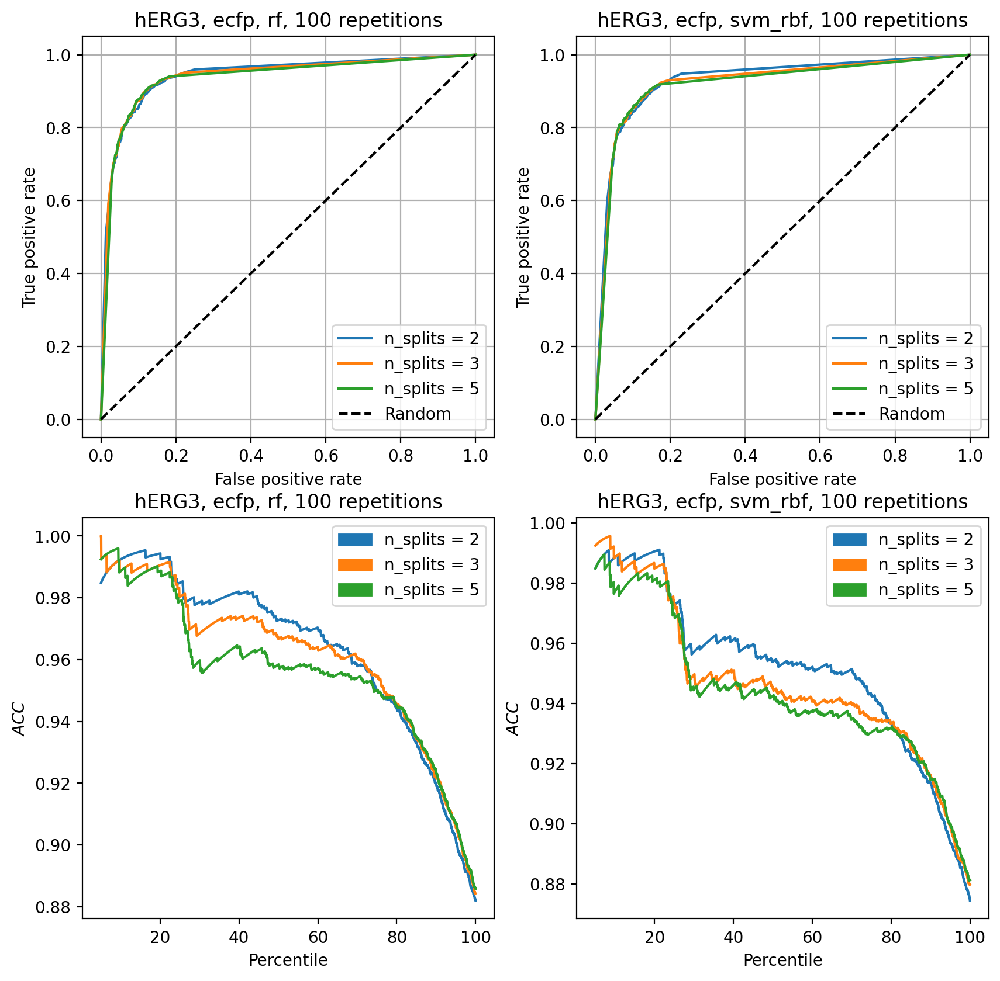

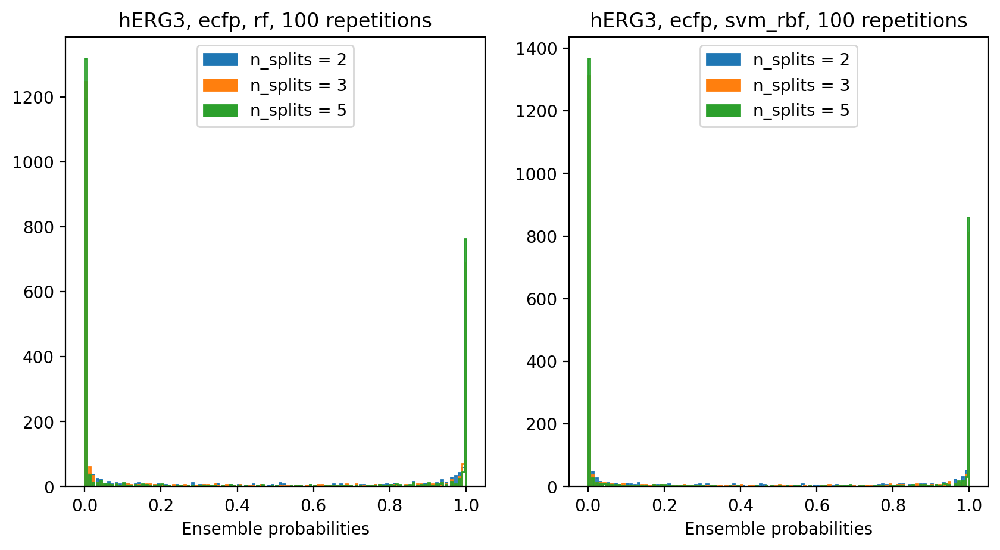

In [6]:
evaluation_automatization('hERG3', 'ecfp', ['rf', 'svm_rbf'], repetitions=100)

#### Testing repetitions Clintox:

Repetition [1/3]


100%|█████████████████████████████████████████████| 3/3 [00:01<00:00,  2.13it/s]


Repetition [2/3]


100%|█████████████████████████████████████████████| 3/3 [00:02<00:00,  1.16it/s]


Repetition [3/3]


100%|█████████████████████████████████████████████| 3/3 [00:04<00:00,  1.65s/it]


Repetition [1/3]


100%|█████████████████████████████████████████████| 3/3 [00:03<00:00,  1.28s/it]


Repetition [2/3]


100%|█████████████████████████████████████████████| 3/3 [00:07<00:00,  2.44s/it]


Repetition [3/3]


100%|█████████████████████████████████████████████| 3/3 [00:14<00:00,  4.85s/it]


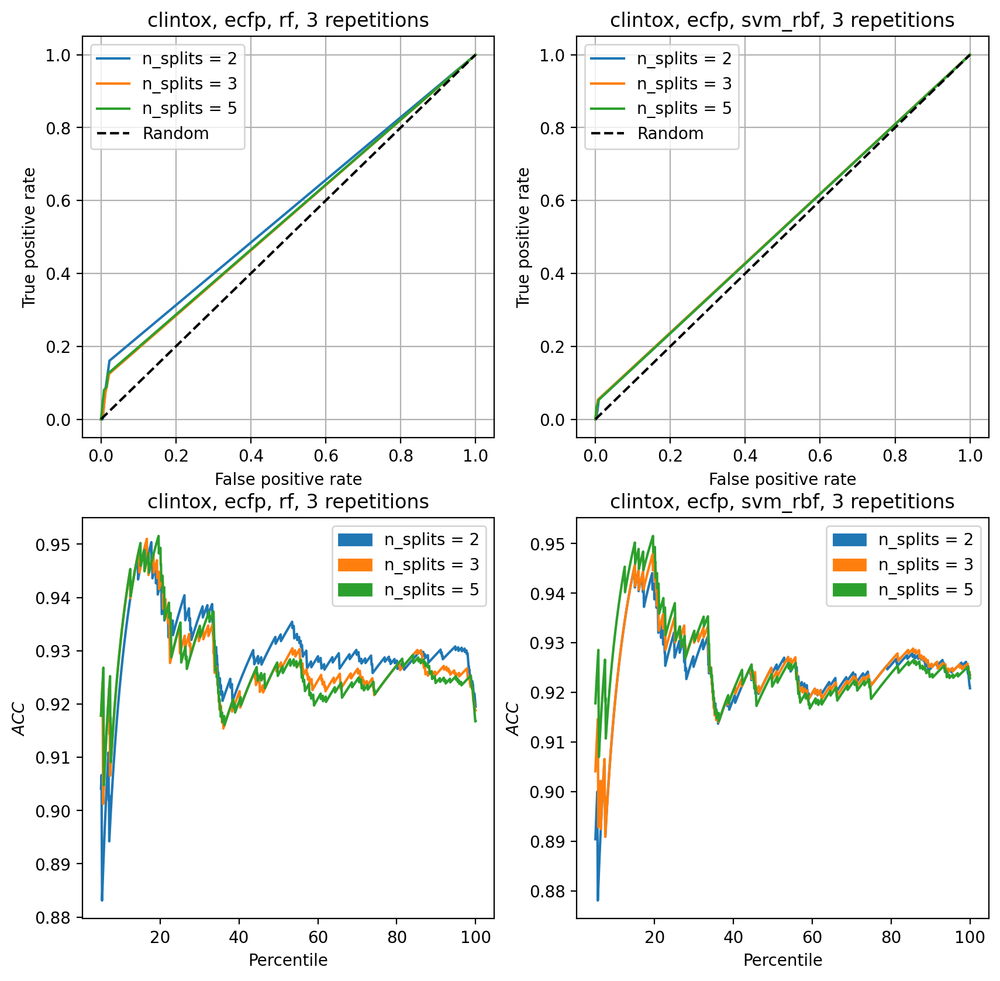

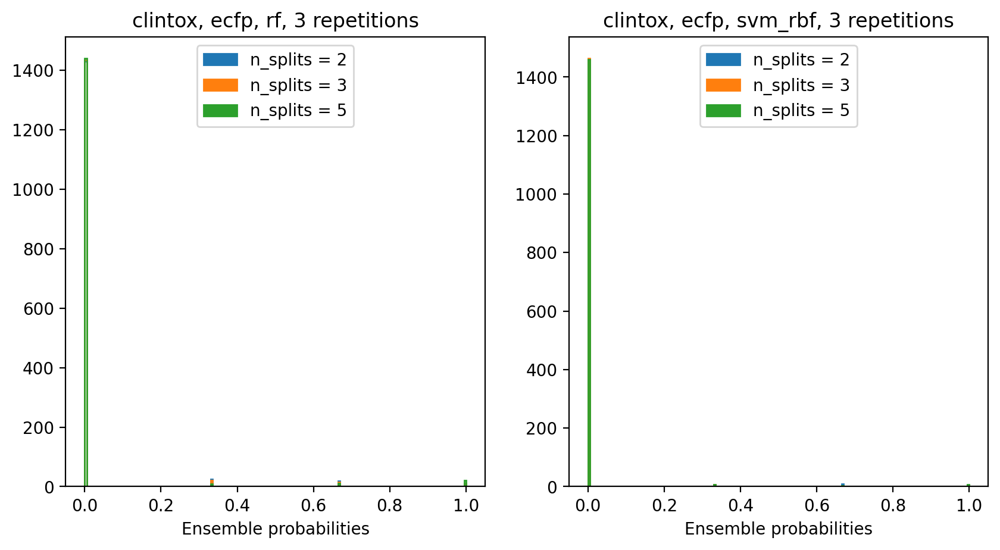

In [7]:
evaluation_automatization('clintox', 'ecfp', ['rf', 'svm_rbf'], repetitions=3)

Repetition [1/3]


100%|█████████████████████████████████████████████| 5/5 [00:02<00:00,  2.14it/s]


Repetition [2/3]


100%|█████████████████████████████████████████████| 5/5 [00:04<00:00,  1.16it/s]


Repetition [3/3]


100%|█████████████████████████████████████████████| 5/5 [00:08<00:00,  1.66s/it]


Repetition [1/3]


100%|█████████████████████████████████████████████| 5/5 [00:06<00:00,  1.29s/it]


Repetition [2/3]


100%|█████████████████████████████████████████████| 5/5 [00:12<00:00,  2.46s/it]


Repetition [3/3]


100%|█████████████████████████████████████████████| 5/5 [00:24<00:00,  4.91s/it]


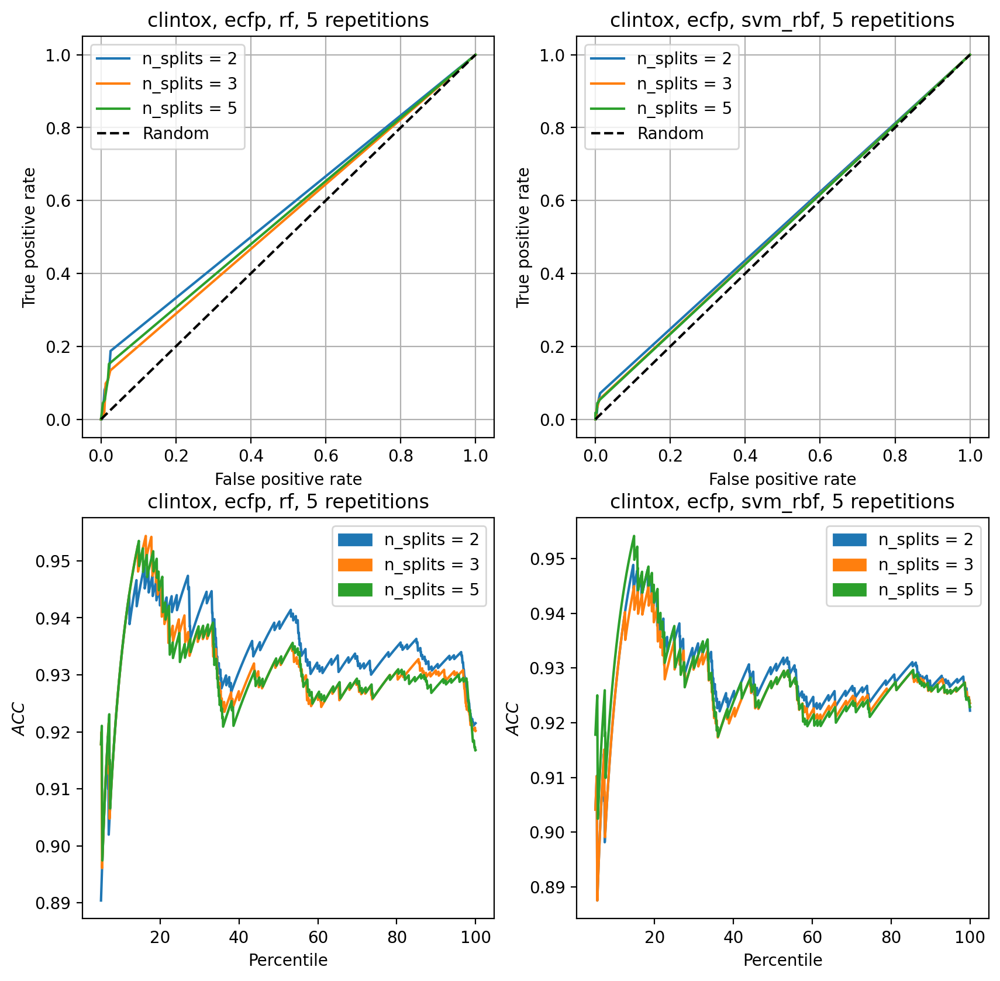

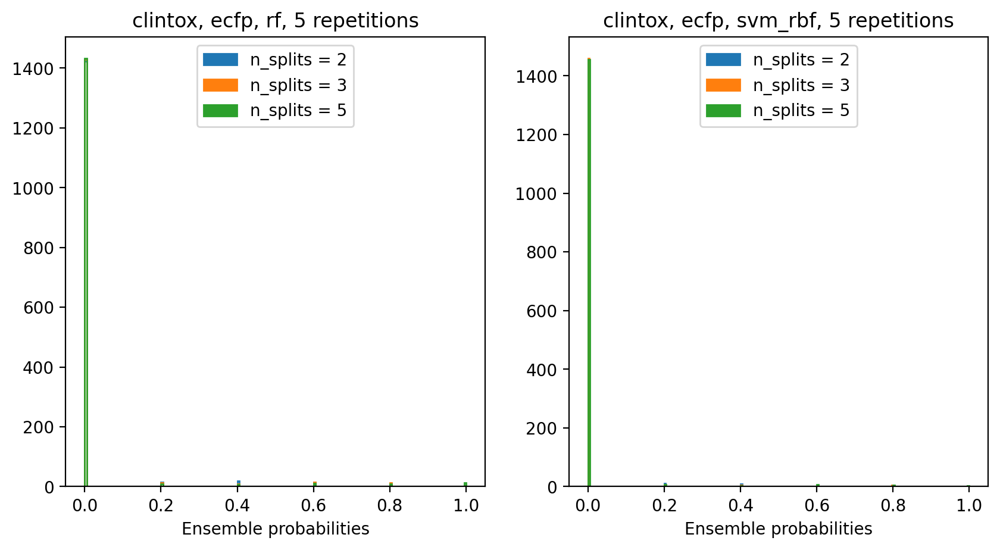

In [8]:
evaluation_automatization('clintox', 'ecfp', ['rf', 'svm_rbf'], repetitions=5)

Repetition [1/3]


100%|███████████████████████████████████████████| 15/15 [00:06<00:00,  2.15it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 15/15 [00:12<00:00,  1.16it/s]


Repetition [3/3]


100%|███████████████████████████████████████████| 15/15 [00:24<00:00,  1.66s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 15/15 [00:19<00:00,  1.30s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 15/15 [00:37<00:00,  2.48s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 15/15 [01:14<00:00,  4.98s/it]


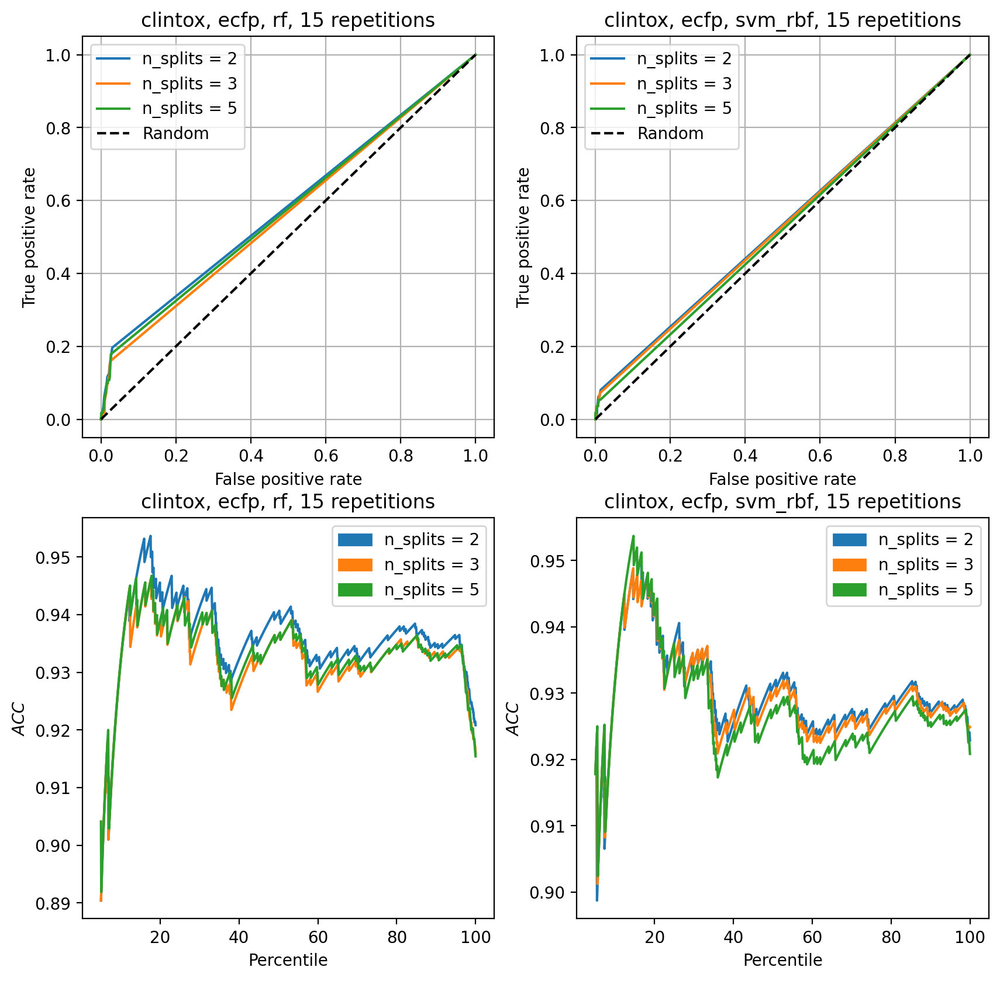

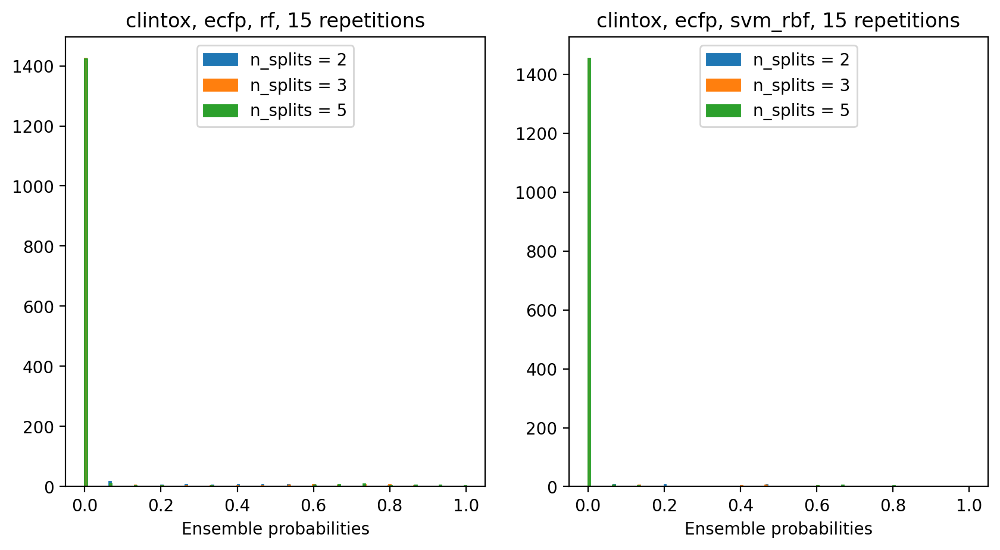

In [9]:
evaluation_automatization('clintox', 'ecfp', ['rf', 'svm_rbf'], repetitions=15)

Repetition [1/3]


100%|███████████████████████████████████████████| 25/25 [00:11<00:00,  2.14it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 25/25 [00:21<00:00,  1.18it/s]


Repetition [3/3]


100%|███████████████████████████████████████████| 25/25 [00:40<00:00,  1.62s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 25/25 [00:32<00:00,  1.30s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 25/25 [01:02<00:00,  2.49s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 25/25 [02:02<00:00,  4.89s/it]


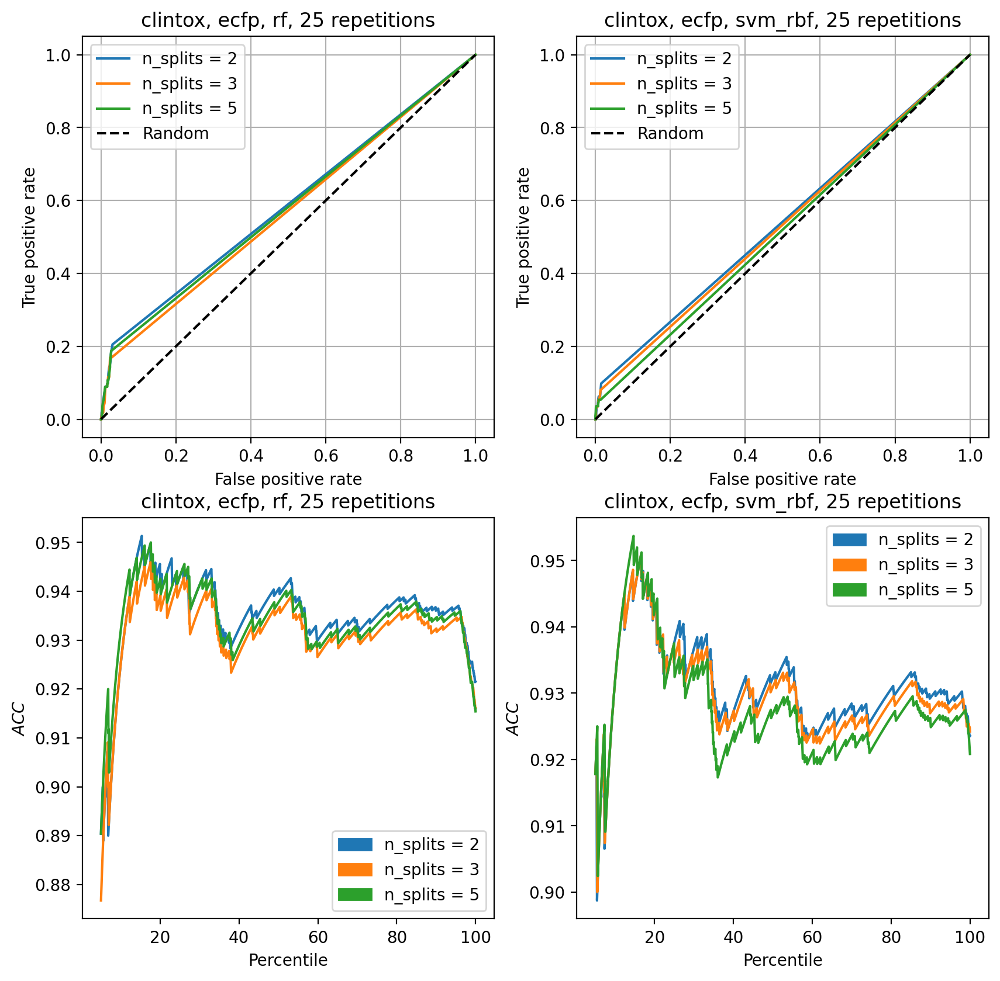

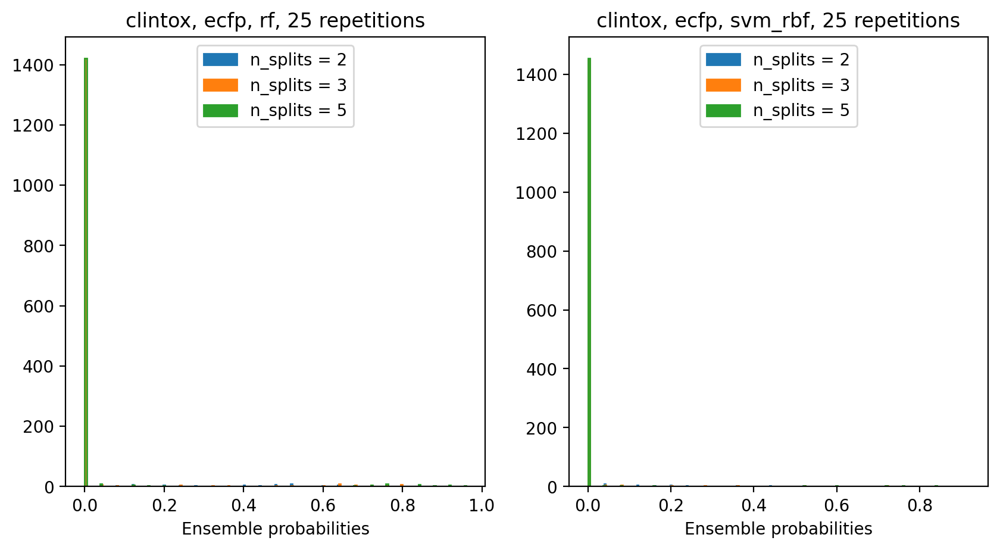

In [10]:
evaluation_automatization('clintox', 'ecfp', ['rf', 'svm_rbf'], repetitions=25)

Repetition [1/3]


100%|███████████████████████████████████████████| 50/50 [00:23<00:00,  2.17it/s]


Repetition [2/3]


100%|███████████████████████████████████████████| 50/50 [00:43<00:00,  1.16it/s]


Repetition [3/3]


100%|███████████████████████████████████████████| 50/50 [01:22<00:00,  1.65s/it]


Repetition [1/3]


100%|███████████████████████████████████████████| 50/50 [01:05<00:00,  1.30s/it]


Repetition [2/3]


100%|███████████████████████████████████████████| 50/50 [01:57<00:00,  2.35s/it]


Repetition [3/3]


100%|███████████████████████████████████████████| 50/50 [03:51<00:00,  4.64s/it]


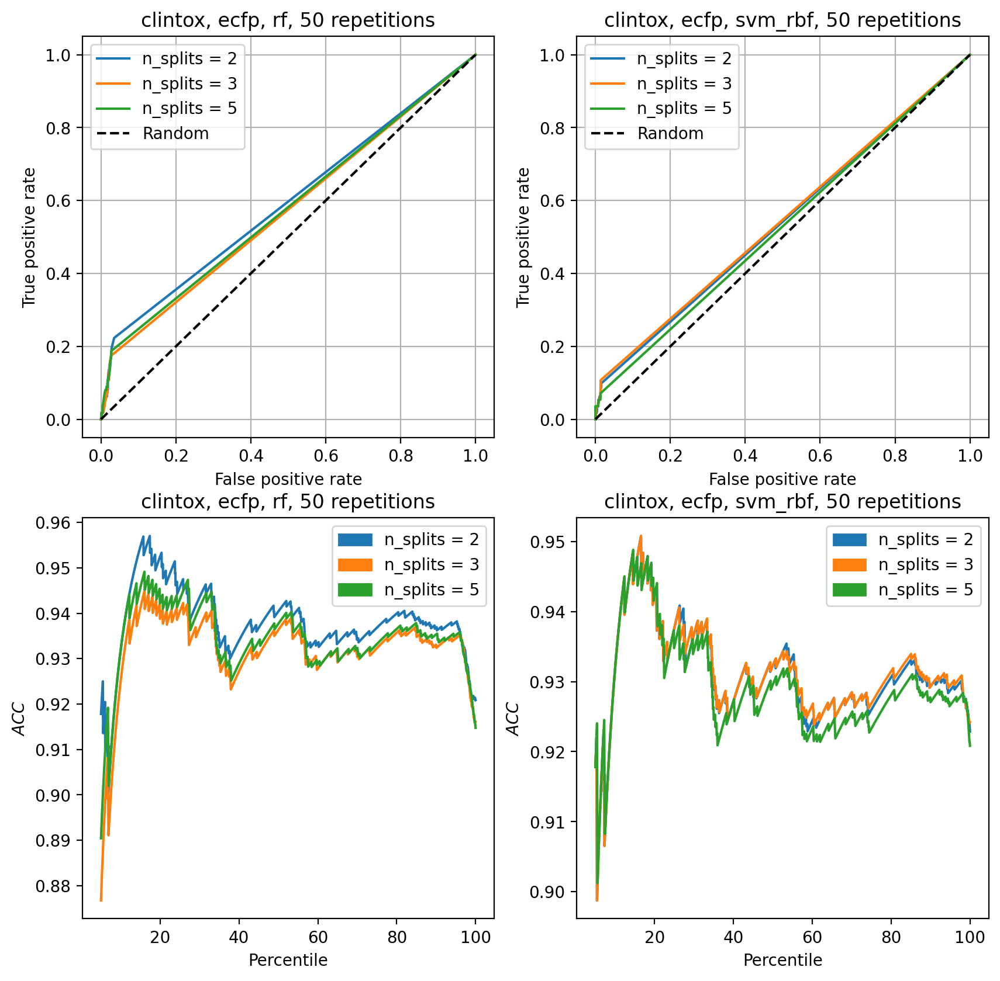

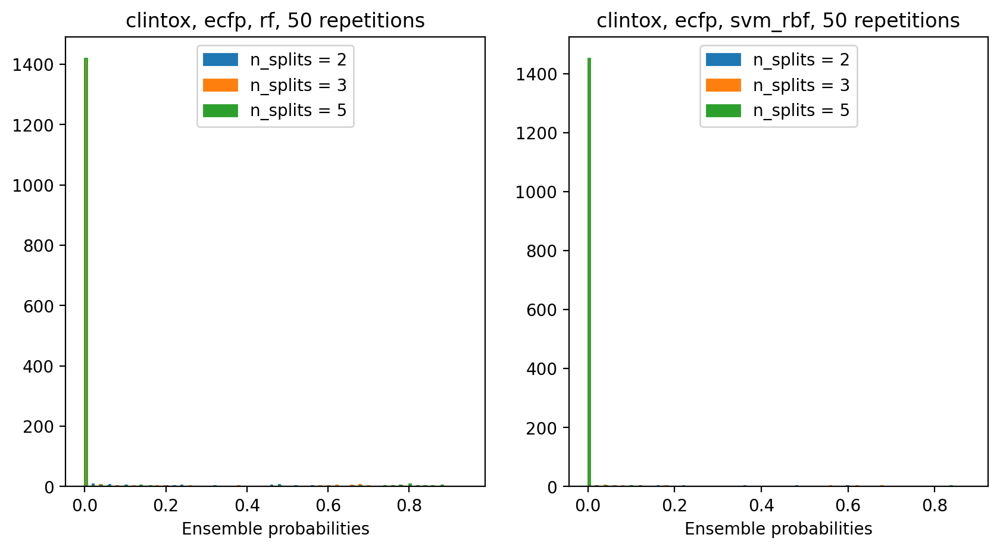

In [11]:
evaluation_automatization('clintox', 'ecfp', ['rf', 'svm_rbf'], repetitions=50)

Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [00:44<00:00,  2.26it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [01:20<00:00,  1.24it/s]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [02:38<00:00,  1.58s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [02:09<00:00,  1.29s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [04:01<00:00,  2.42s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [08:01<00:00,  4.82s/it]


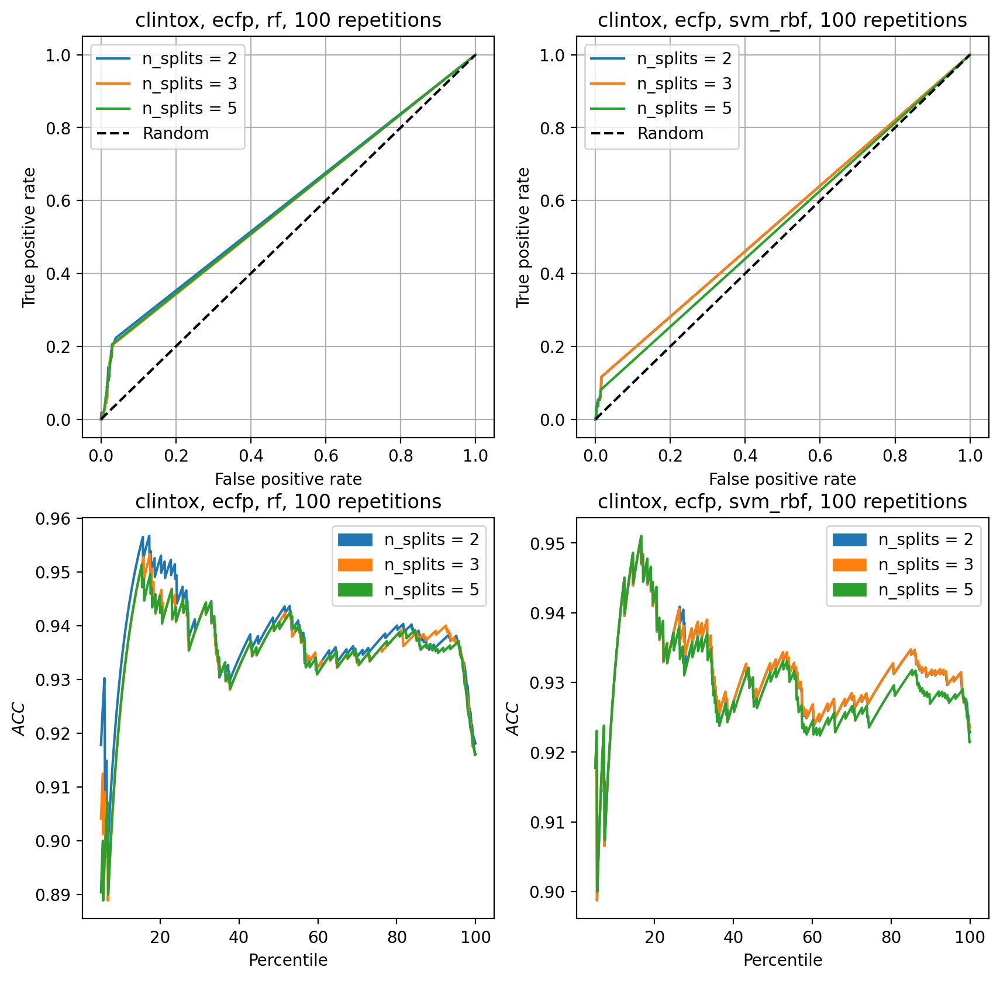

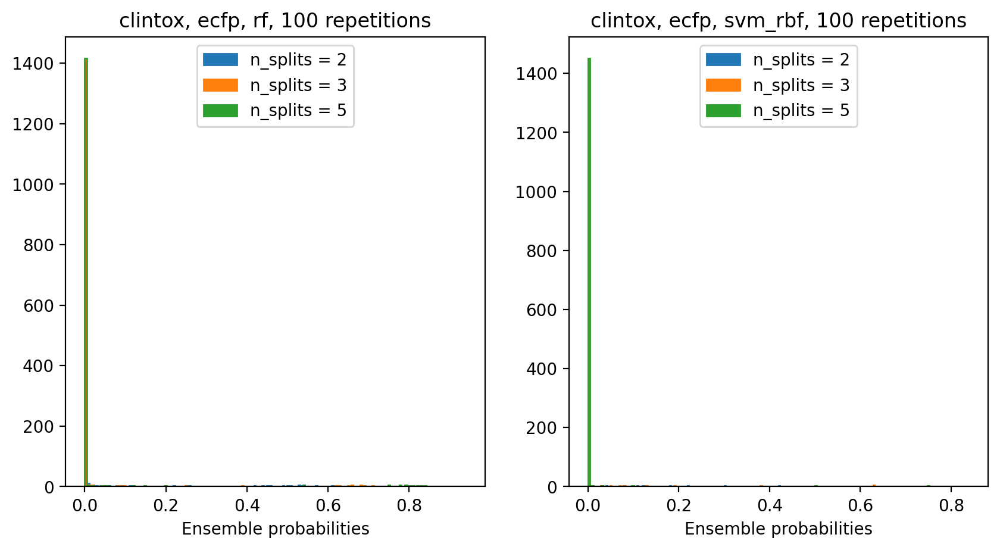

In [12]:
evaluation_automatization('clintox', 'ecfp', ['rf', 'svm_rbf'], repetitions=100)

#### Testing multiple:

In [ ]:
# folder = f'~/PowerFolders/ensemble_ad/data/featurized/{TASK}/{name}/'
for i in os.listdir('~/PowerFolders/ensemble_ad/data/featurized/classification/'):
    evaluation_automatization(i, 'ecfp', ['rf', 'xgb', 'svm_rbf', 'shallow', 'deep'], repetitions=1)

In [ ]:
for i in os.listdir('~/PowerFolders/ensemble_ad/data/featurized/classification/'):
    evaluation_automatization(i, 'ecfp', ['rf', 'xgb', 'svm_rbf', 'shallow', 'deep'], repetitions=3)

### BBBP ECFP 100 Repetitions

Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [03:20<00:00,  2.00s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [07:05<00:00,  4.25s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [14:34<00:00,  8.75s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [00:44<00:00,  2.25it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [01:27<00:00,  1.14it/s]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [02:57<00:00,  1.77s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [01:25<00:00,  1.17it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [02:54<00:00,  1.75s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [06:01<00:00,  3.61s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [16:47<00:00, 10.08s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [33:18<00:00, 19.98s/it]


Repetition [3/3]


100%|███████████████████████████████████████| 100/100 [1:02:39<00:00, 37.60s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [21:10<00:00, 12.71s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [40:22<00:00, 24.23s/it]


Repetition [3/3]


100%|███████████████████████████████████████| 100/100 [1:18:16<00:00, 46.97s/it]


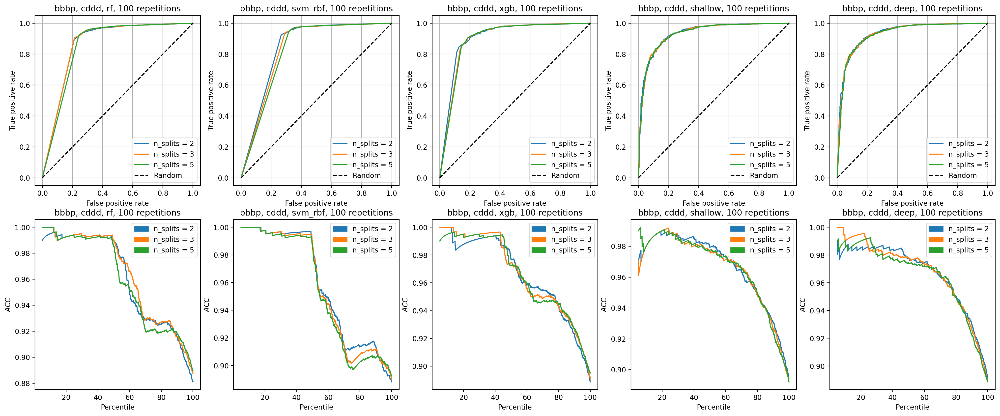

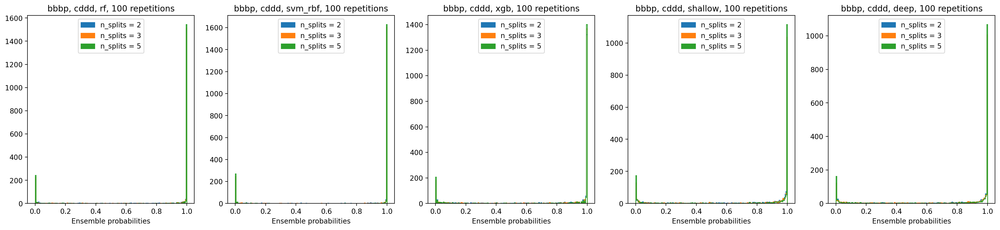

In [5]:
evaluation_automatization('bbbp', 'cddd', ['rf', 'svm_rbf', 'xgb', 'shallow', 'deep'], repetitions=100)

Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [01:48<00:00,  1.09s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [03:47<00:00,  2.28s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [07:53<00:00,  4.74s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [00:39<00:00,  2.54it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [01:12<00:00,  1.38it/s]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [02:23<00:00,  1.44s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [01:14<00:00,  1.35it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [02:30<00:00,  1.51s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [05:09<00:00,  3.09s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [12:36<00:00,  7.57s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [24:52<00:00, 14.92s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [48:15<00:00, 28.95s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [16:04<00:00,  9.65s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [31:09<00:00, 18.69s/it]


Repetition [3/3]


100%|███████████████████████████████████████| 100/100 [1:00:13<00:00, 36.14s/it]


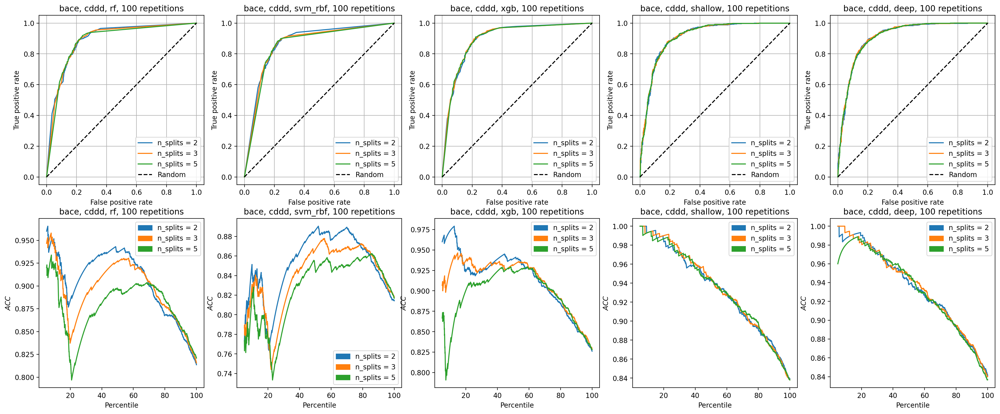

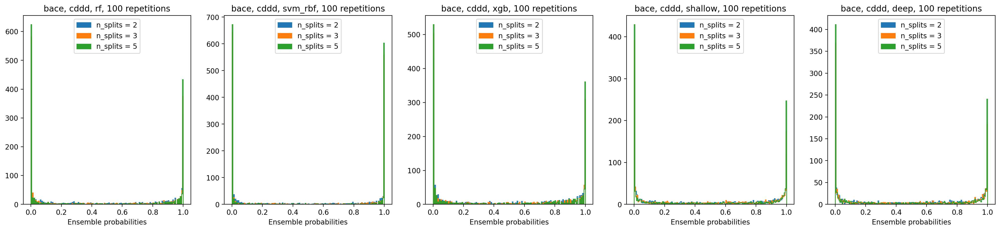

In [11]:
evaluation_automatization('bace', 'cddd', ['rf', 'svm_rbf', 'xgb', 'shallow', 'deep'], repetitions=100)

Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [03:19<00:00,  2.00s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [07:05<00:00,  4.25s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [14:59<00:00,  8.99s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [01:19<00:00,  1.26it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [02:38<00:00,  1.59s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [05:18<00:00,  3.19s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [02:24<00:00,  1.44s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [05:56<00:00,  3.56s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [13:38<00:00,  8.19s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [14:47<00:00,  8.87s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [41:59<00:00, 25.19s/it]


Repetition [3/3]


100%|███████████████████████████████████████| 100/100 [1:17:43<00:00, 46.63s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [27:05<00:00, 16.26s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [53:24<00:00, 32.04s/it]


Repetition [3/3]


100%|███████████████████████████████████████| 100/100 [1:46:13<00:00, 63.73s/it]


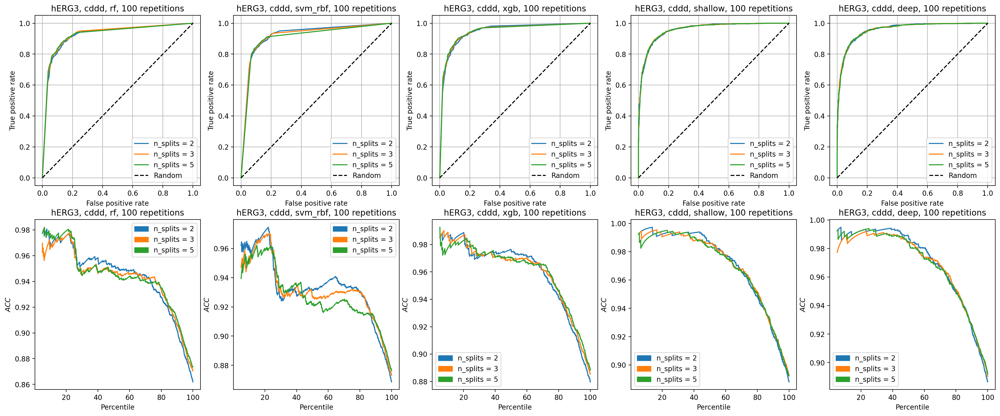

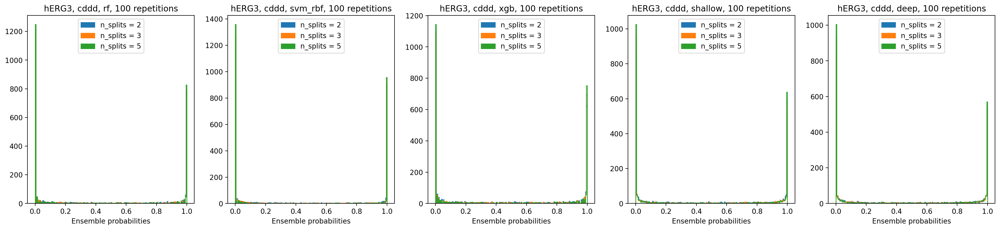

In [5]:
evaluation_automatization('hERG3', 'cddd', ['rf', 'svm_rbf', 'xgb', 'shallow', 'deep'], repetitions=100)

Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [02:04<00:00,  1.25s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [04:22<00:00,  2.63s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [09:01<00:00,  5.42s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [00:19<00:00,  5.05it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [00:37<00:00,  2.67it/s]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [01:10<00:00,  1.41it/s]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [00:52<00:00,  1.89it/s]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [01:45<00:00,  1.05s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [03:32<00:00,  2.13s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [13:14<00:00,  7.94s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [24:49<00:00, 14.90s/it]


Repetition [3/3]


100%|█████████████████████████████████████████| 100/100 [48:29<00:00, 29.10s/it]


Repetition [1/3]


100%|█████████████████████████████████████████| 100/100 [16:36<00:00,  9.97s/it]


Repetition [2/3]


100%|█████████████████████████████████████████| 100/100 [31:00<00:00, 18.61s/it]


Repetition [3/3]


100%|███████████████████████████████████████| 100/100 [1:00:27<00:00, 36.27s/it]


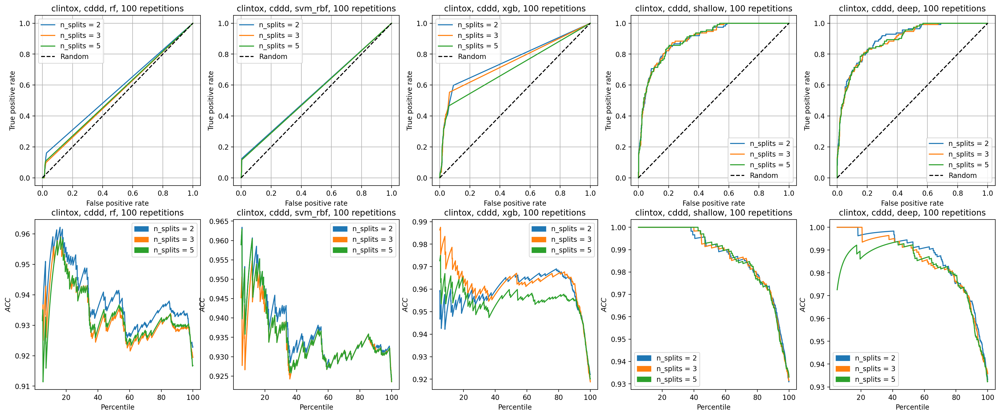

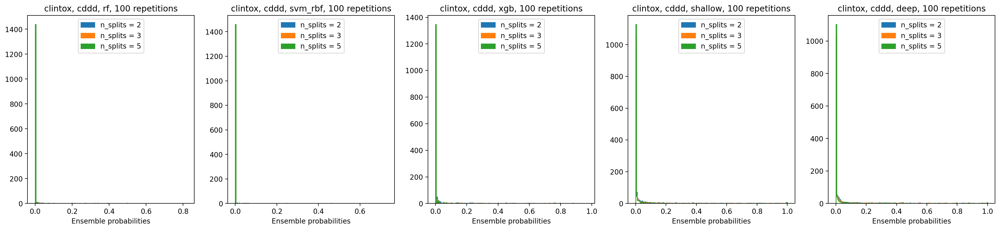

In [6]:
evaluation_automatization('clintox', 'cddd', ['rf', 'svm_rbf', 'xgb', 'shallow', 'deep'], repetitions=100)